# Semantic segmentation using U-Net convolutional encoder-decoder (2nd round)

# Treament description

## Semantic segmentation (2nd round)
The main steps are:
1. the dataset is divided into [train, test and validation sets](#data_splitting_3)
2. the semantic segmentation model is realized using a Keras convolutional encoder-decoder ([U-Net](#unet_def_3) for this first version)
3. the training process is monitored to check the quality of the model according to [different measures](#unet_eval_3)
4. as [test](#unet_test_3), some original images (and their corresponding generated and predicted mask) from the test set are displayed
5. the final model is used to add a [crack mask](#crack_detection_3) on larger pictures using cropping.

## Comparison with another source of data
It exists datasets of concrete crack images with their associated mask: https://www.kaggle.com/datasets/motono0223/concrete-crack-segmentation-dataset.

Let's see if it is possible to reach [similar results](#test_on_other_source).

# Packages, data & functions
## Import Packages

In [1]:
import os
cwd = os.getcwd()
import numpy as np 
import pandas as pd 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow.keras import applications
from tensorflow.keras.models import Model
from tensorflow.keras.utils import image_dataset_from_directory
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from keras.preprocessing import image
# Define function to plot some images
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import cv2
from PIL import Image

#Mixed precision is useful if compute capability > 7
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

from numpy.random import seed
seed(42)
tf.keras.utils.set_random_seed(42)

2023-06-21 13:55:10.672873: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-21 13:55:11.183189: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-06-21 13:55:12.281228: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-06-21 13:55:12.281367: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or 

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3050 Laptop GPU, compute capability 8.6


2023-06-21 13:55:14.454558: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-21 13:55:14.560980: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-21 13:55:14.561078: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-21 13:55:14.561888: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


## Overall Settings

In [2]:
image_height = 224
image_width = 224
unet_image_height = 256
unet_image_width = 256

## Load data

In [3]:
unet_base_dir = "/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/"

unet_base_dataset = image_dataset_from_directory(
    unet_base_dir,
    labels=None,
    image_size = (image_height, image_width),
    crop_to_aspect_ratio = True,
    shuffle = False,
    batch_size = 1)

Found 120000 files belonging to 1 classes.


2023-06-21 13:55:17.169276: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-21 13:55:17.171554: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-21 13:55:17.171629: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-21 13:55:17.171682: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built witho

In [4]:
unet_base_df = pd.DataFrame(unet_base_dataset.file_paths.copy())
unet_base_df.columns = ['unet_fullpaths_image']
unet_base_df[['unet_fullpaths_mask']] = unet_base_df[['unet_fullpaths_image']]
unet_base_df['unet_fullpaths_mask'] = unet_base_df.apply(lambda x: str(x.unet_fullpaths_image).replace('image', 'mask_2'), axis=1)

In [5]:
pd.set_option('display.max_colwidth', None)

In [6]:
display(unet_base_df)

,unet_fullpaths_image,unet_fullpaths_mask
0,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00001.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00001.jpg
1,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00002.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00002.jpg
2,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00003.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00003.jpg
3,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00004.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00004.jpg
4,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00005.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00005.jpg
...,...,...
119995,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19996.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19996.jpg
119996,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19997.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19997.jpg
119997,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19998.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19998.jpg
119998,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19999.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19999.jpg


In [7]:
unet_base_df['unet_fullpaths_image'].str.contains("mask_2")

0         False
1         False
2         False
3         False
4         False
          ...  
119995     True
119996     True
119997     True
119998     True
119999     True
Name: unet_fullpaths_image, Length: 120000, dtype: bool

In [8]:
unet_base_df = unet_base_df[~unet_base_df['unet_fullpaths_image'].str.contains("mask_2")]

In [9]:
unet_base_df = unet_base_df[~unet_base_df['unet_fullpaths_image'].str.contains("mask")]

In [10]:
display(unet_base_df)

,unet_fullpaths_image,unet_fullpaths_mask
0,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00001.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00001.jpg
1,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00002.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00002.jpg
2,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00003.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00003.jpg
3,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00004.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00004.jpg
4,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00005.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00005.jpg
...,...,...
39995,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19996.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19996.jpg
39996,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19997.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19997.jpg
39997,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19998.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19998.jpg
39998,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19999.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19999.jpg


<a id="data_splitting_3"></a>
## Split data

In [11]:
# 60% - train set,
# 20% - validation set,
# 20% - test set

unet_train_df, unet_valid_df, unet_test_df = np.split(unet_base_df.sample(frac=1, random_state=42), [int(.6*len(unet_base_df)), int(.8*len(unet_base_df))])

In [12]:
unet_valid_df

,unet_fullpaths_image,unet_fullpaths_mask
17441,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_17442.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_17442.jpg
10156,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_10157.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_10157.jpg
7687,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_07688.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_07688.jpg
2629,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_02630.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_02630.jpg
7699,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_07700.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_07700.jpg
...,...,...
35414,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_15415_1.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_15415_1.jpg
25738,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_05739.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_05739.jpg
32713,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_12714_1.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_12714_1.jpg
21669,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_01670.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_01670.jpg


### Data Generators
<a id="data_preprocessing"></a>

For more information:
- [ImageDataGenerator](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)


In [13]:
unet_gen = ImageDataGenerator(rescale         = 1./255.,
                              horizontal_flip = True,
                              vertical_flip   = True,
                              zoom_range      = 0.05,
                              rotation_range  = 25)
UNET_BATCH_SIZE = 1


### Data agumentation and pre-processing using tensorflow on train set

In [14]:
unet_train_generator_image = unet_gen.flow_from_dataframe(unet_train_df,
                                               directory = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/',
                                               class_mode=None,
                                               x_col = 'unet_fullpaths_image',
#                                               color_mode = "grayscale",
                                               target_size = (unet_image_height, unet_image_width), 
                                               batch_size = UNET_BATCH_SIZE,
                                               shuffle = True,
                                               seed = 42)

Found 24000 validated image filenames.


In [15]:
unet_train_generator_mask = unet_gen.flow_from_dataframe(unet_train_df,
                                               directory = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/',
                                               class_mode=None,
                                               x_col = 'unet_fullpaths_mask',
                                               color_mode = "grayscale",
                                               target_size = (unet_image_height, unet_image_width), 
                                               batch_size = UNET_BATCH_SIZE,
                                               shuffle = True,
                                               seed = 42)

Found 24000 validated image filenames.


In [16]:
def create_gens(image_gen, mask_gen):
    gen = zip(image_gen, mask_gen)
    for (img, msk) in gen:
        msk[msk > 0.5] = 1
        msk[msk <= 0.5] = 0
        yield (img, msk)

unet_train_gen = create_gens(unet_train_generator_image, unet_train_generator_mask)

### Data agumentation and pre-processing using tensorflow on test and validation sets

In [17]:
unet_test_gen = ImageDataGenerator(rescale = 1./255.)

unet_validation_generator_image = unet_test_gen.flow_from_dataframe(unet_valid_df,
                                               directory = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/',
                                               class_mode=None,
                                               x_col = 'unet_fullpaths_image',
#                                               color_mode = "grayscale",
                                               target_size = (unet_image_height, unet_image_width), 
                                               batch_size = UNET_BATCH_SIZE,
                                               shuffle = True,
                                               seed = 42)

unet_validation_generator_mask = unet_test_gen.flow_from_dataframe(unet_valid_df,
                                               directory = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/',
                                               class_mode=None,
                                               x_col = 'unet_fullpaths_mask',
                                               color_mode = "grayscale",
                                               target_size = (unet_image_height, unet_image_width), 
                                               batch_size = UNET_BATCH_SIZE,
                                               shuffle = True,
                                               seed = 42)

Found 8000 validated image filenames.
Found 8000 validated image filenames.


In [18]:
unet_validation_gen = create_gens(unet_validation_generator_image,  unet_validation_generator_mask)

In [19]:
unet_test_generator_image = unet_test_gen.flow_from_dataframe(unet_test_df,
                                               directory = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/',
                                               class_mode=None,
                                               x_col = 'unet_fullpaths_image',
#                                               color_mode = "grayscale",
                                               target_size = (unet_image_height, unet_image_width), 
                                               batch_size = UNET_BATCH_SIZE,
                                               shuffle = True,
                                               seed = 42)

unet_test_generator_mask = unet_test_gen.flow_from_dataframe(unet_test_df,
                                               directory = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/',
                                               class_mode=None,
                                               x_col = 'unet_fullpaths_mask',
                                               color_mode = "grayscale",
                                               target_size = (unet_image_height, unet_image_width), 
                                               batch_size = UNET_BATCH_SIZE,
                                               shuffle = True,
                                               seed = 42)

Found 8000 validated image filenames.
Found 8000 validated image filenames.


In [20]:
unet_test_gen = create_gens(unet_test_generator_image,  unet_test_generator_mask)

<a id="unet_def_3"></a>
## U-Net definition

In [21]:
def unet(input_size=(unet_image_height, unet_image_width, 3)):
    inputs = Input(input_size)
    # First DownConvolution / Encoder Leg will begin, so start with Conv2D
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(inputs)
    bn1 = Activation("relu")(conv1)
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation("relu")(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(pool1)
    bn2 = Activation("relu")(conv2)
    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation("relu")(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(pool2)
    bn3 = Activation("relu")(conv3)
    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation("relu")(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(pool3)
    bn4 = Activation("relu")(conv4)
    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation("relu")(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(pool4)
    bn5 = Activation("relu")(conv5)
    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation("relu")(bn5)

    """ Now UpConvolution / Decoder Leg will begin, so start with Conv2DTranspose
    The gray arrows (in the above image) indicate the skip connections that concatenate the encoder feature map with the decoder, which helps the backward flow of gradients for improved training. """
    """ After every concatenation we again apply two consecutive regular convolutions so that the model can learn to assemble a more precise output """

    up6 = concatenate([Conv2DTranspose(512, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn5), conv4], axis=3)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(up6)
    bn6 = Activation("relu")(conv6)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation("relu")(bn6)

    up7 = concatenate([Conv2DTranspose(256, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn6), conv3], axis=3)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(up7)
    bn7 = Activation("relu")(conv7)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation("relu")(bn7)

    up8 = concatenate([Conv2DTranspose(128, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn7), conv2], axis=3)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(up8)
    bn8 = Activation("relu")(conv8)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation("relu")(bn8)

    up9 = concatenate([Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn8), conv1], axis=3)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(up9)
    bn9 = Activation("relu")(conv9)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation("relu")(bn9)

    conv10 = Conv2D(filters=1, kernel_size=(1, 1), activation="sigmoid")(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

## Useful functions

In [22]:
from tensorflow.keras import backend as K

# function to create dice coefficient
def dice_coef(y_true, y_pred, smooth=100):
    
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)
    return (2 * intersection + smooth) / (union + smooth)

# function to create dice loss
def dice_loss(y_true, y_pred, smooth=100):
    return -dice_coef(y_true, y_pred, smooth)

# function to create iou coefficient
def iou_coef(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou



In [23]:
def plot_training(hist):
    '''
    This function take training model and plot history of accuracy and losses with the best epoch in both of them.
    '''

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_iou = hist.history['iou_coef']
    tr_dice = hist.history['dice_coef']
    tr_loss = hist.history['loss']

    val_acc = hist.history['val_accuracy']
    val_iou = hist.history['val_iou_coef']
    val_dice = hist.history['val_dice_coef']
    val_loss = hist.history['val_loss']

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    index_iou = np.argmax(val_iou)
    iou_highest = val_iou[index_iou]
    index_dice = np.argmax(val_dice)
    dice_highest = val_dice[index_dice]
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    Epochs = [i+1 for i in range(len(tr_acc))]

    acc_label = f'best epoch= {str(index_acc + 1)}'
    iou_label = f'best epoch= {str(index_iou + 1)}'
    dice_label = f'best epoch= {str(index_dice + 1)}'
    loss_label = f'best epoch= {str(index_loss + 1)}'

    # Plot training history
    plt.figure(figsize=(10, 10))
#    plt.figure(figsize= (20, 20))
#    plt.style.use('fivethirtyeight')
    plt.rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['font.size'] = 10
    # Training Accuracy
    plt.subplot(2, 2, 1)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Training IoU
    plt.subplot(2, 2, 2)
    plt.plot(Epochs, tr_iou, 'r', label= 'Training IoU')
    plt.plot(Epochs, val_iou, 'g', label= 'Validation IoU')
    plt.scatter(index_iou + 1 , iou_highest, s= 150, c= 'blue', label= iou_label)
    plt.title('Training and Validation IoU Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()

    # Training Dice
    plt.subplot(2, 2, 3)
    plt.plot(Epochs, tr_dice, 'r', label= 'Training Dice')
    plt.plot(Epochs, val_dice, 'g', label= 'Validation Dice')
    plt.scatter(index_dice + 1 , dice_highest, s= 150, c= 'blue', label= dice_label)
    plt.title('Training and Validation Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice')
    plt.legend()

    # Training Loss
    plt.subplot(2, 2, 4)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

#    plt.tight_layout
    plt.show()

## U-Net compilation and training

In [24]:
unet_model_2 = unet()
unet_model_2.compile(tf.keras.optimizers.Adam(learning_rate= 0.0001), loss= dice_loss, metrics= ['accuracy', iou_coef, dice_coef])

unet_model_2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 activation (Activation)        (None, 256, 256, 64  0           ['conv2d[0][0]']                 
                                )                                                             

In [26]:
epochs = 16
batch_size = 32

# callbacks = [ModelCheckpoint('unet.hdf5', verbose=0, save_best_only=True)]
# Call backs:
# - early stopping
early = tf.keras.callbacks.EarlyStopping( monitor = "val_dice_coef",
                                          patience = 3,
                                          min_delta = 0.001,
                                          verbose=1,
                                          restore_best_weights = False)
# - tensor board
tensor_board = tf.keras.callbacks.TensorBoard(log_dir='./Graph', histogram_freq=0, write_graph=True, write_images=True)

# - reduce on plateau
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_dice_coef', factor=0.1, patience=3, min_lr=0.00001)

history = unet_model_2.fit(unet_train_gen,
                         steps_per_epoch=len(unet_train_df) / batch_size,
                         epochs=epochs,
                         verbose=1,
                         callbacks = [early, tensor_board, reduce_lr],
                         validation_data = unet_validation_gen,
                         validation_steps=len(unet_valid_df) / batch_size)

Epoch 1/16
750/750 [==============================] - 51s 68ms/step - loss: -0.7360 - accuracy: 0.9974 - iou_coef: 0.7054 - dice_coef: 0.7361 - val_loss: -0.7461 - val_accuracy: 0.9983 - val_iou_coef: 0.7215 - val_dice_coef: 0.7462 - lr: 1.0000e-05
Epoch 2/16
750/750 [==============================] - 51s 68ms/step - loss: -0.7645 - accuracy: 0.9979 - iou_coef: 0.7363 - dice_coef: 0.7644 - val_loss: -0.7669 - val_accuracy: 0.9983 - val_iou_coef: 0.7384 - val_dice_coef: 0.7668 - lr: 1.0000e-05
Epoch 3/16
750/750 [==============================] - 51s 68ms/step - loss: -0.7803 - accuracy: 0.9978 - iou_coef: 0.7508 - dice_coef: 0.7801 - val_loss: -0.7918 - val_accuracy: 0.9983 - val_iou_coef: 0.7664 - val_dice_coef: 0.7916 - lr: 1.0000e-05
Epoch 4/16
750/750 [==============================] - 51s 68ms/step - loss: -0.7884 - accuracy: 0.9981 - iou_coef: 0.7627 - dice_coef: 0.7881 - val_loss: -0.7907 - val_accuracy: 0.9985 - val_iou_coef: 0.7648 - val_dice_coef: 0.7905 - lr: 1.0000e-05
Epoc

<a id="unet_eval_3"></a>
## U-Net evaluation

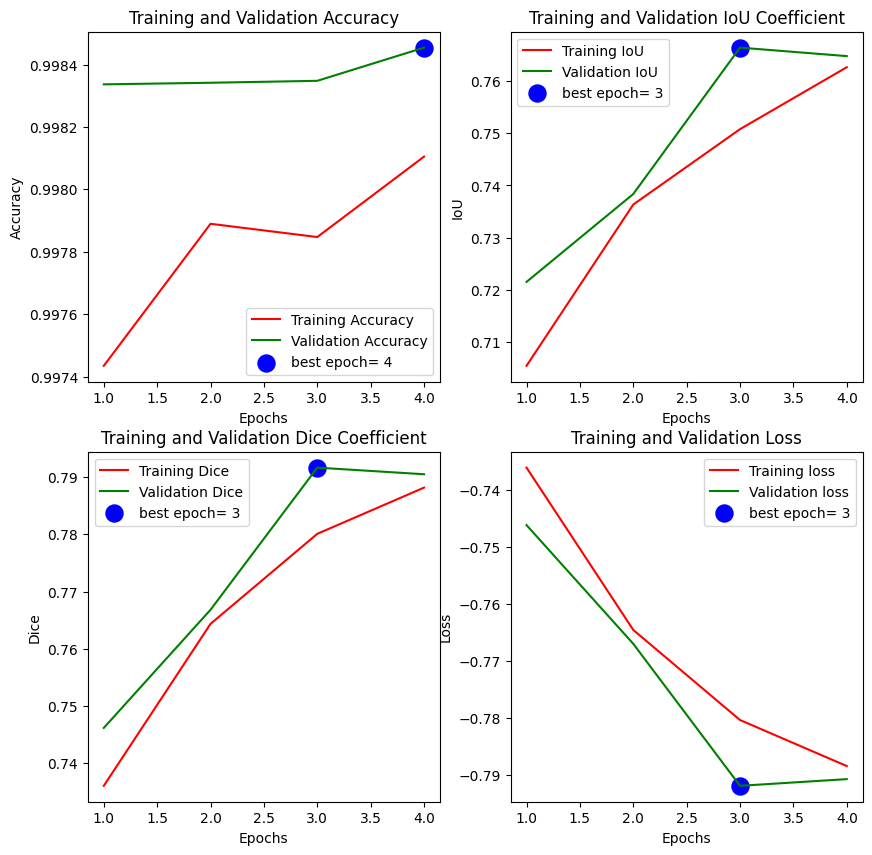

In [27]:
plt.rcParams.update(plt.rcParamsDefault)
plot_training(history)

<a id="unet_test_3"></a>
## U-Net testing

index =  3684
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_13234.jpg
1/1 [==============================] - 0s 255ms/step
(256, 256)


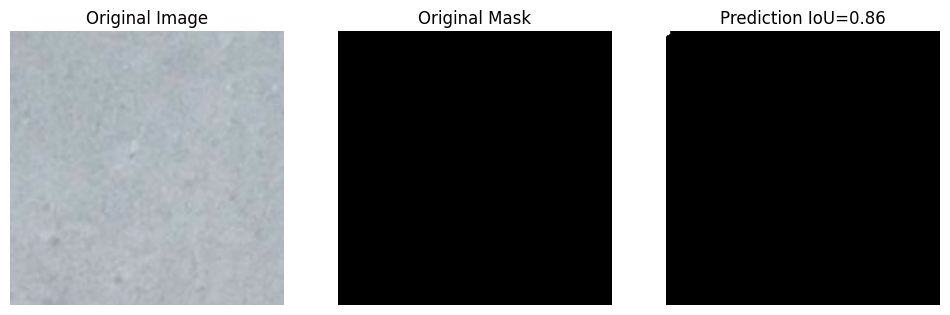

index =  2589
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_18644_1.jpg
1/1 [==============================] - 0s 47ms/step
(256, 256)


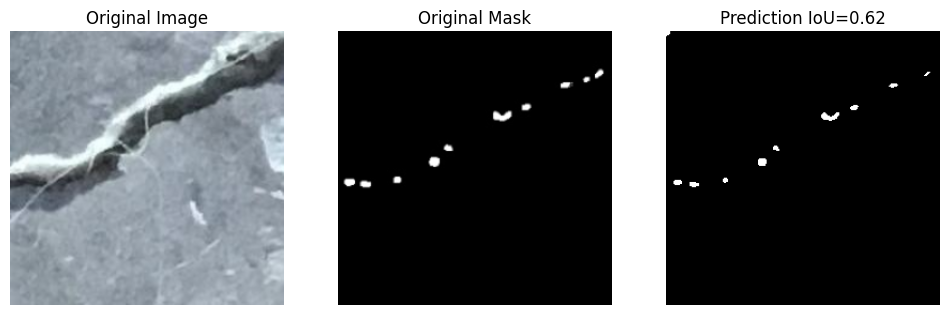

index =  4251
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_15530_1.jpg
1/1 [==============================] - 0s 45ms/step
(256, 256)


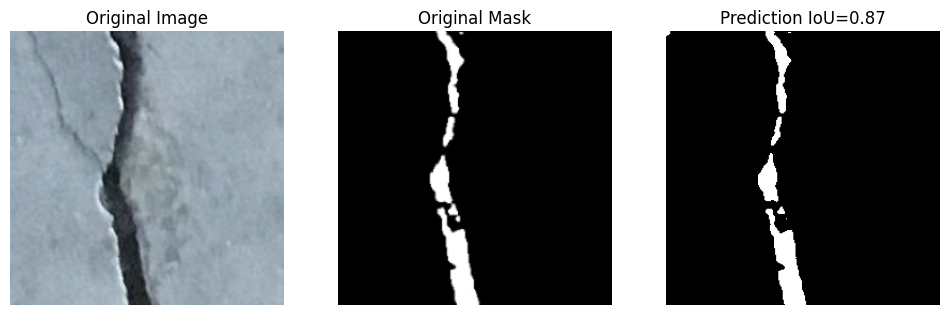

index =  3901
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_02251.jpg
1/1 [==============================] - 0s 45ms/step
(256, 256)


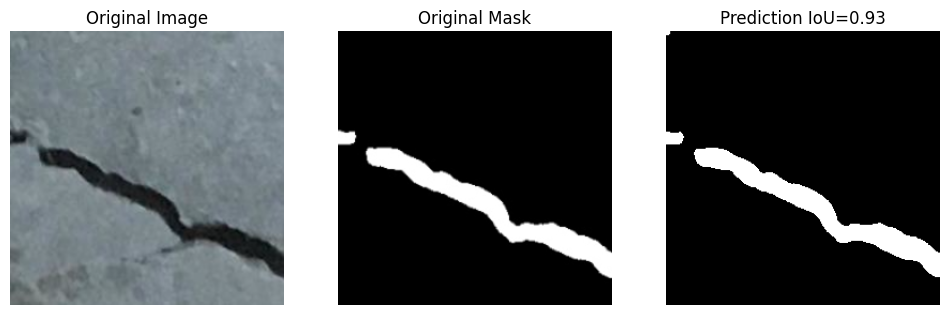

index =  7955
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_14542.jpg
1/1 [==============================] - 0s 40ms/step
(256, 256)


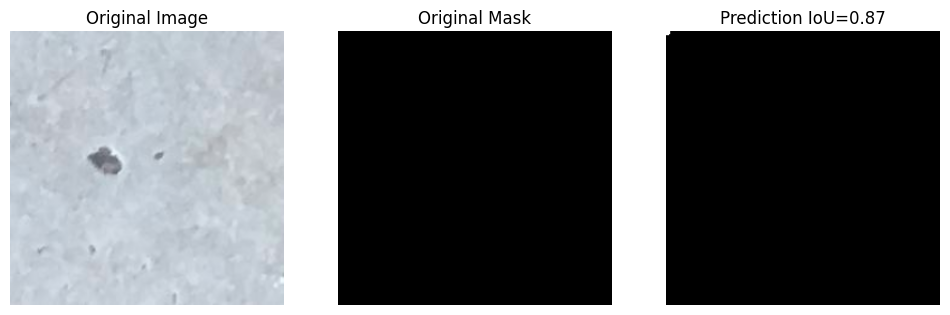

index =  5454
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_04080.jpg
1/1 [==============================] - 0s 31ms/step
(256, 256)


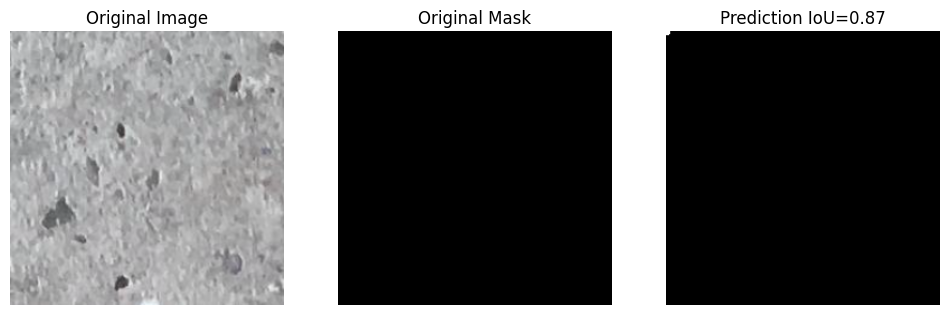

index =  260
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_16692.jpg
1/1 [==============================] - 0s 33ms/step
(256, 256)


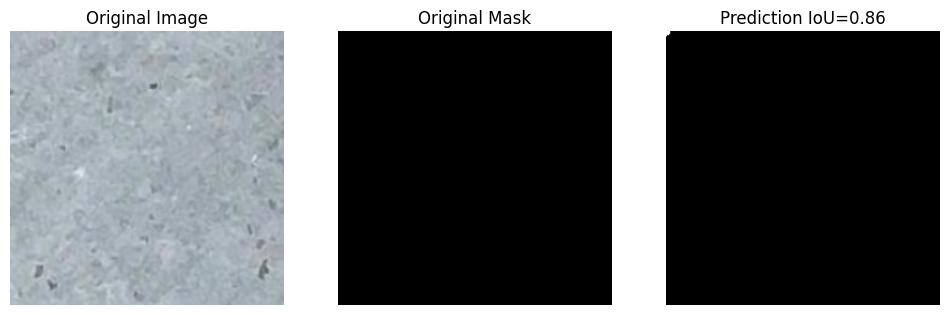

index =  6962
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_08866.jpg
1/1 [==============================] - 0s 33ms/step
(256, 256)


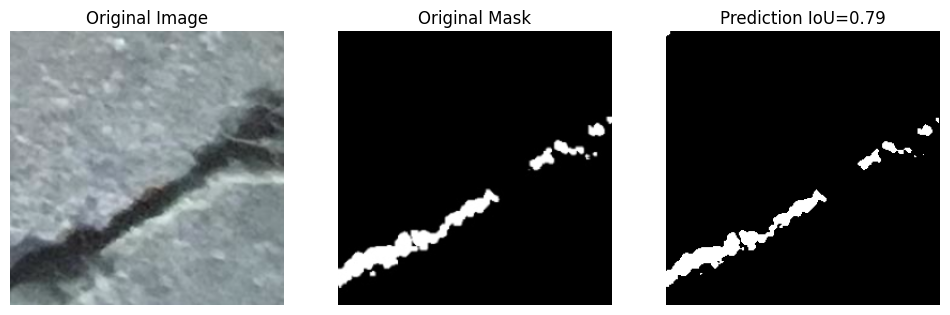

index =  1316
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_15606.jpg
1/1 [==============================] - 0s 30ms/step
(256, 256)


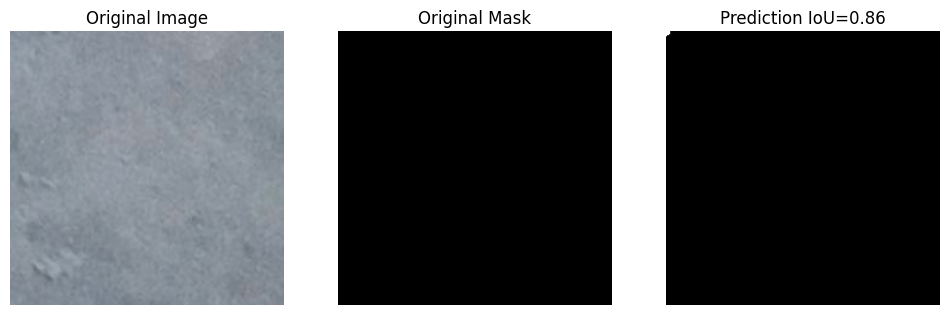

index =  3748
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_13679_1.jpg
1/1 [==============================] - 0s 34ms/step
(256, 256)


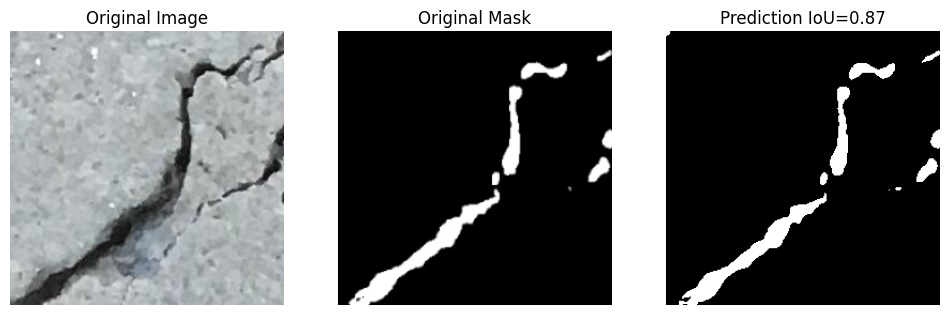

index =  931
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_18228_1.jpg
1/1 [==============================] - 0s 31ms/step
(256, 256)


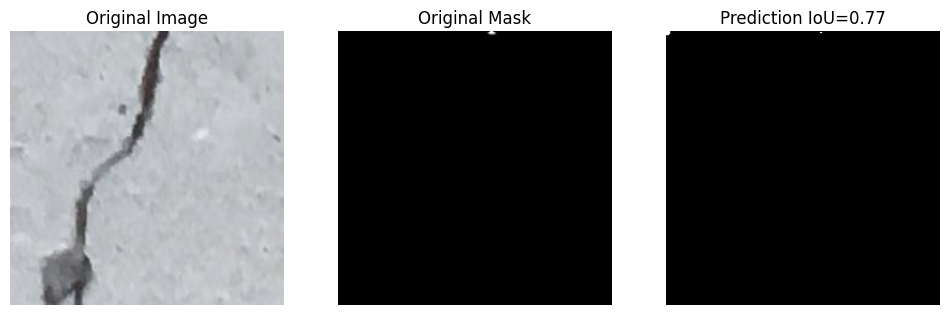

index =  4351
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_12978.jpg
1/1 [==============================] - 0s 46ms/step
(256, 256)


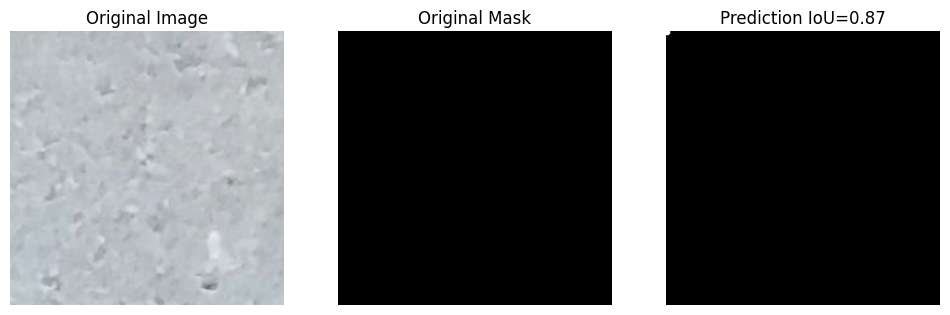

index =  6857
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_15836_1.jpg
1/1 [==============================] - 0s 33ms/step
(256, 256)


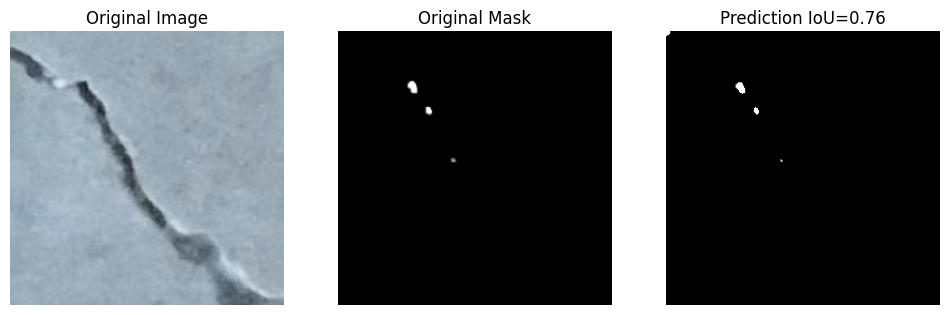

index =  5549
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_10933_1.jpg
1/1 [==============================] - 0s 34ms/step
(256, 256)


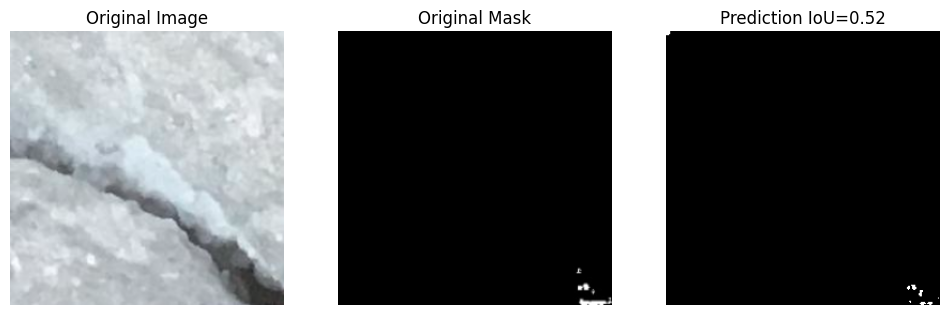

index =  891
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_10349_1.jpg
1/1 [==============================] - 0s 32ms/step
(256, 256)


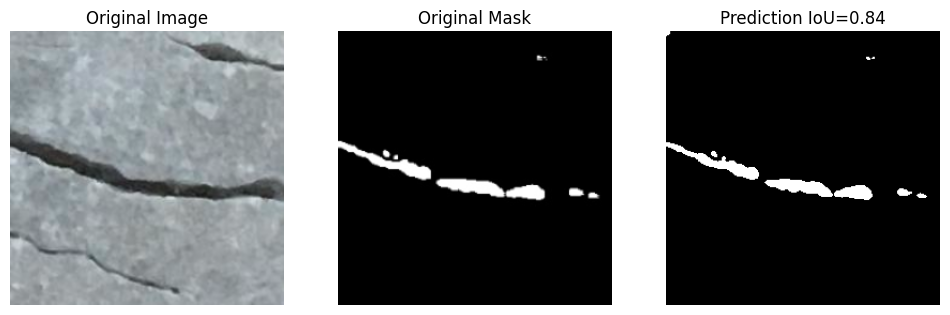

index =  4576
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_11581.jpg
1/1 [==============================] - 0s 30ms/step
(256, 256)


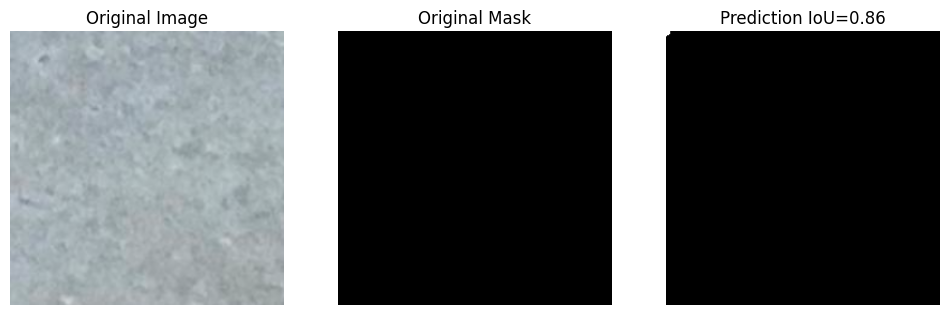

index =  6454
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_18441.jpg
1/1 [==============================] - 0s 31ms/step
(256, 256)


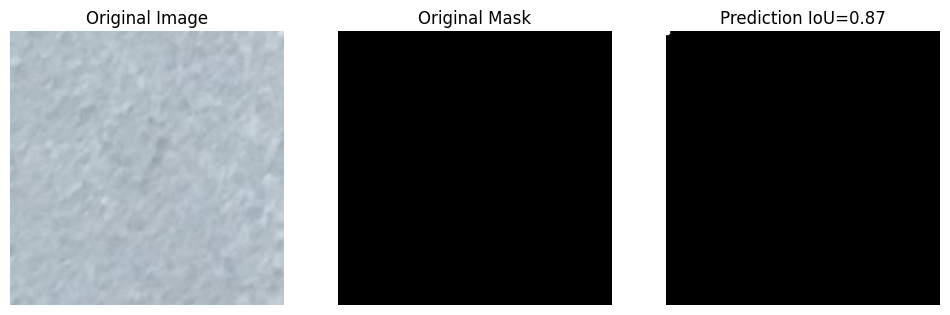

index =  2636
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_03475.jpg
1/1 [==============================] - 0s 33ms/step
(256, 256)


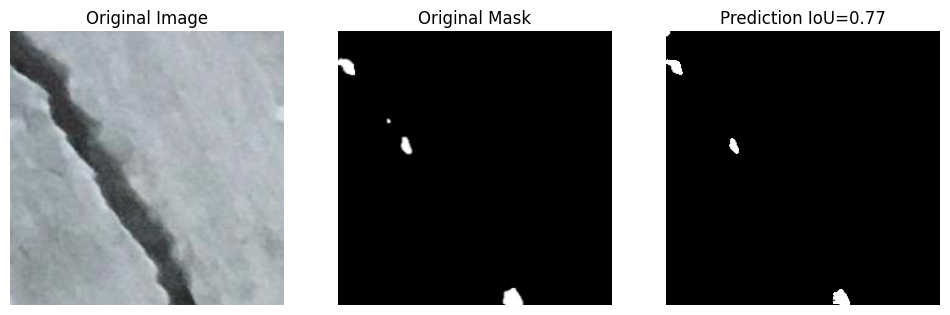

index =  7536
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_18889.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


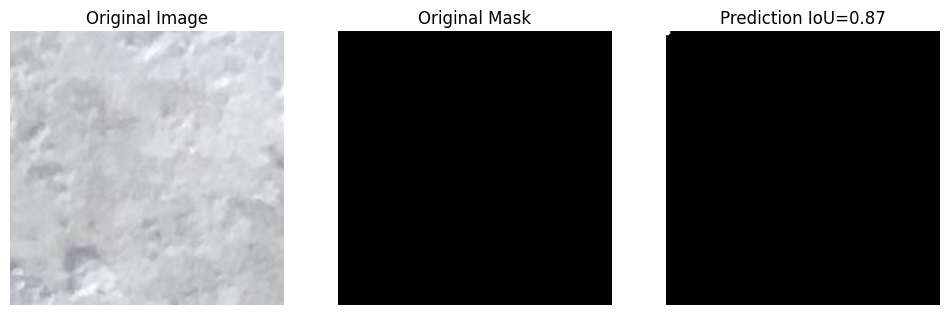

index =  4656
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_03817.jpg
1/1 [==============================] - 0s 43ms/step
(256, 256)


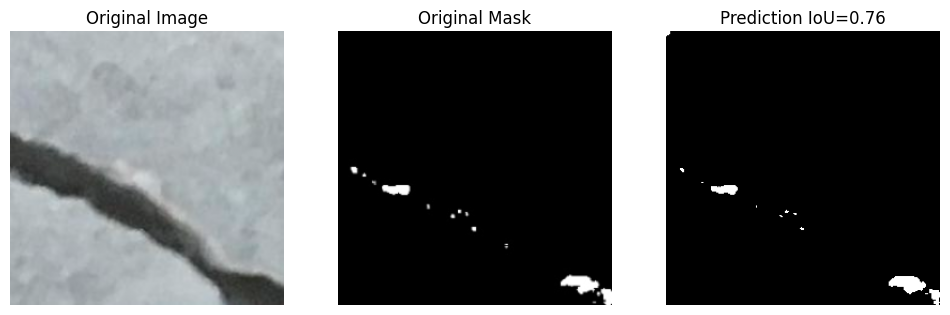

index =  6285
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_17276.jpg
1/1 [==============================] - 0s 49ms/step
(256, 256)


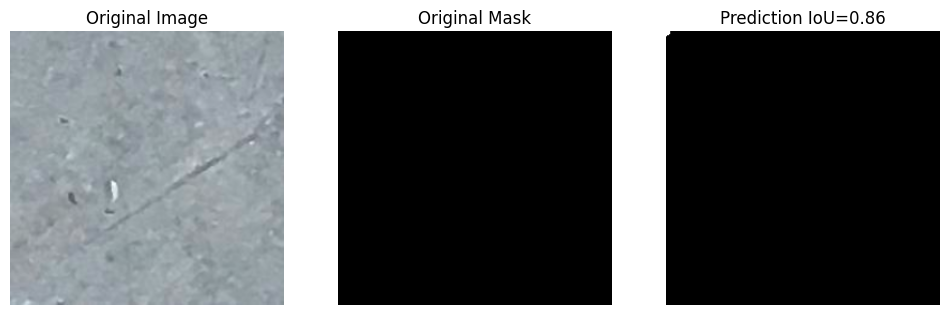

index =  5431
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_07517.jpg
1/1 [==============================] - 0s 29ms/step
(256, 256)


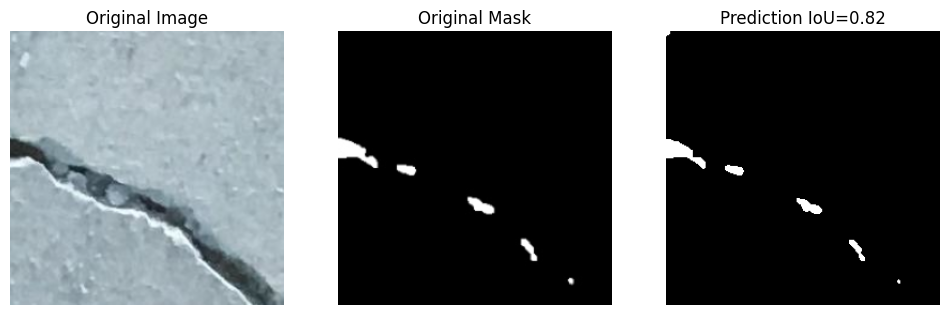

index =  6271
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_18846_1.jpg
1/1 [==============================] - 0s 31ms/step
(256, 256)


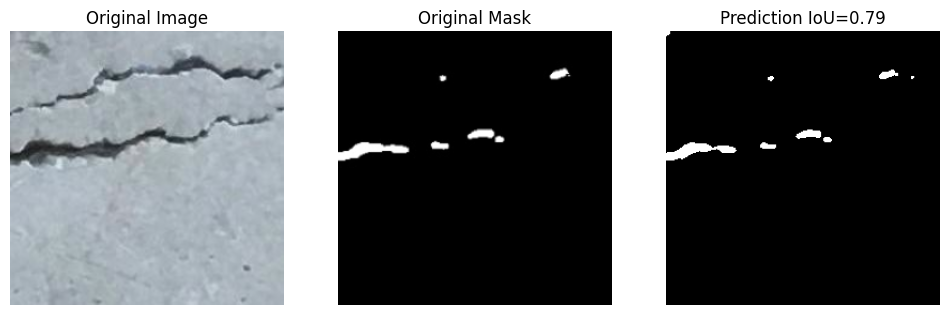

index =  6121
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_09161.jpg
1/1 [==============================] - 0s 30ms/step
(256, 256)


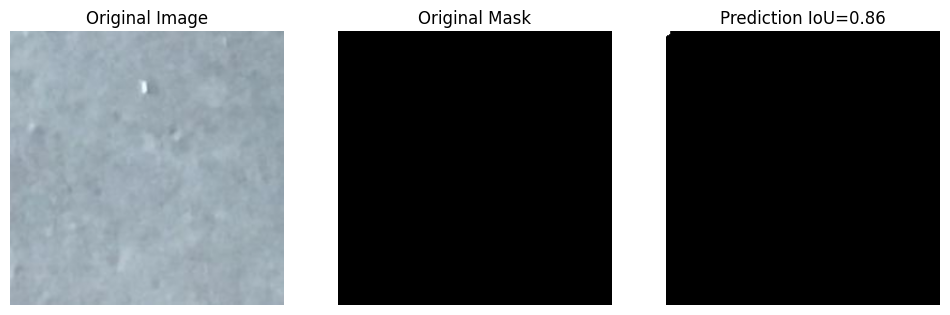

index =  3176
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_16756.jpg
1/1 [==============================] - 0s 33ms/step
(256, 256)


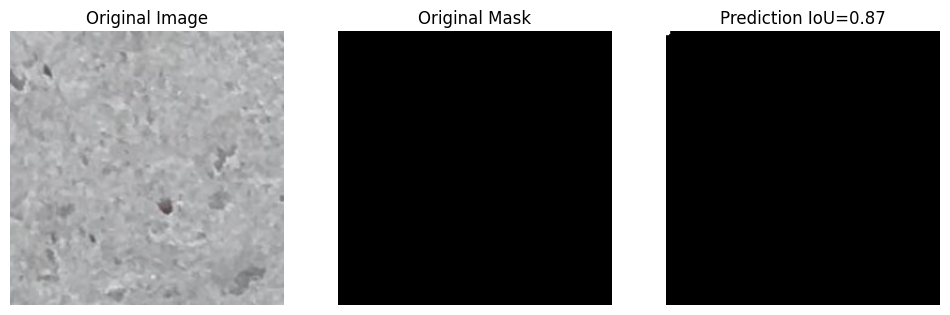

index =  3899
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_17360.jpg
1/1 [==============================] - 0s 31ms/step
(256, 256)


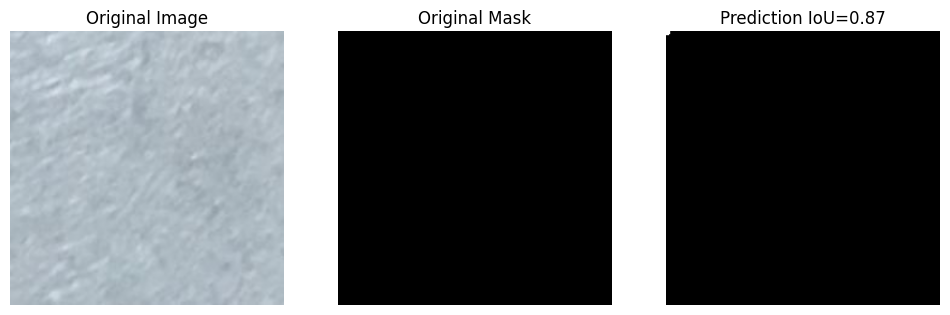

index =  1117
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_04056.jpg
1/1 [==============================] - 0s 45ms/step
(256, 256)


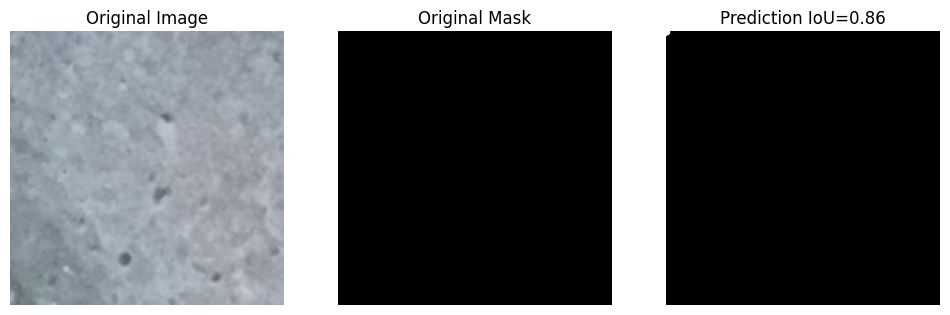

index =  2280
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00068.jpg
1/1 [==============================] - 0s 44ms/step
(256, 256)


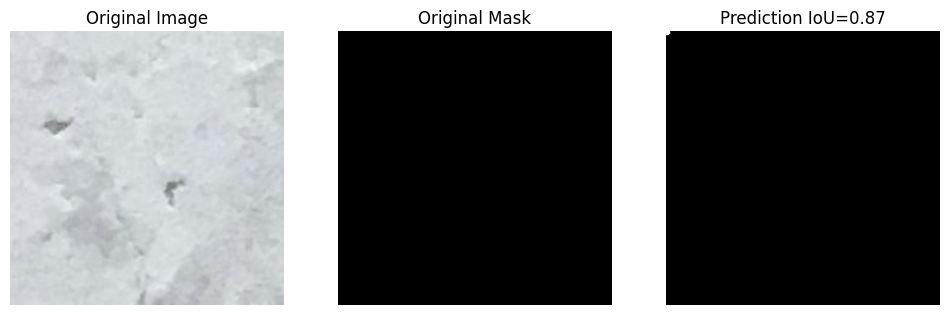

index =  5225
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_16716.jpg
1/1 [==============================] - 0s 36ms/step
(256, 256)


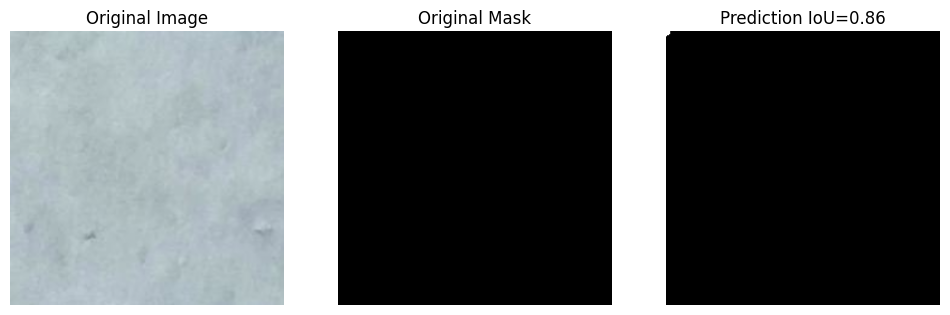

index =  4853
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_04973.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


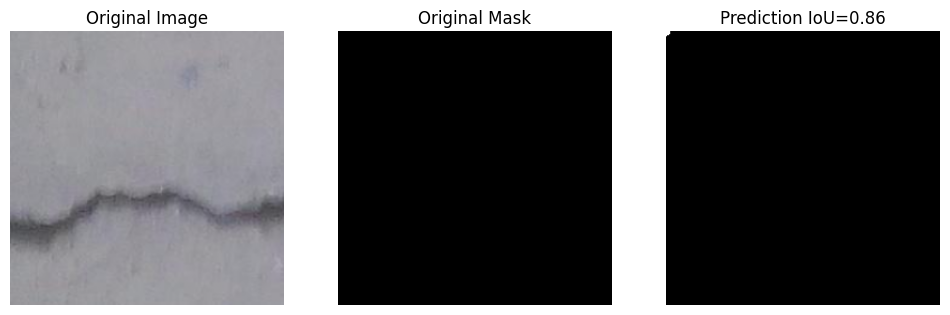

index =  2830
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_17814_1.jpg
1/1 [==============================] - 0s 36ms/step
(256, 256)


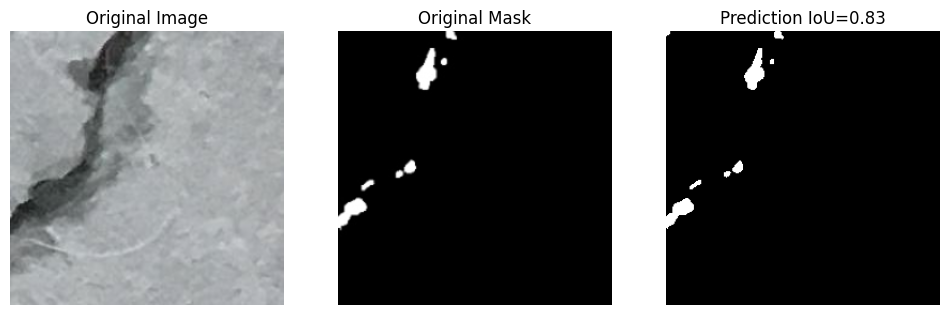

index =  6157
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_02669.jpg
1/1 [==============================] - 0s 29ms/step
(256, 256)


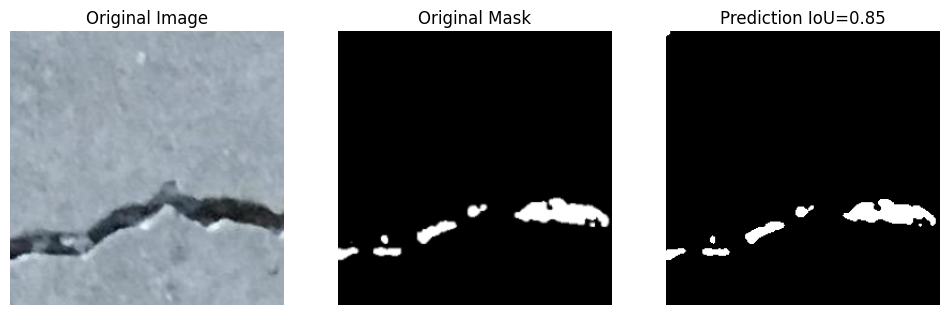

index =  5322
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19555.jpg
1/1 [==============================] - 0s 40ms/step
(256, 256)


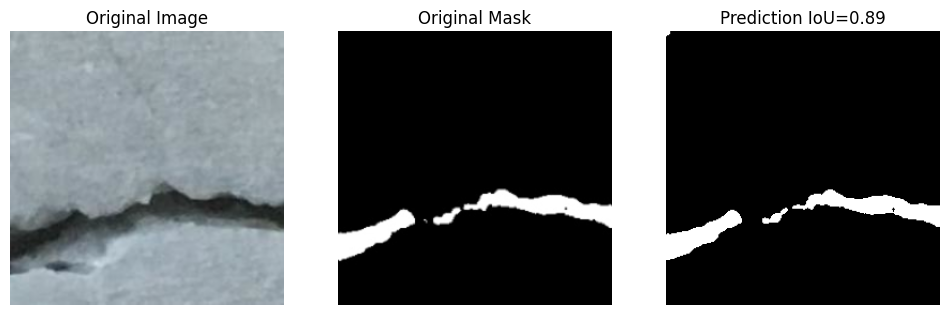

index =  460
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_03413.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


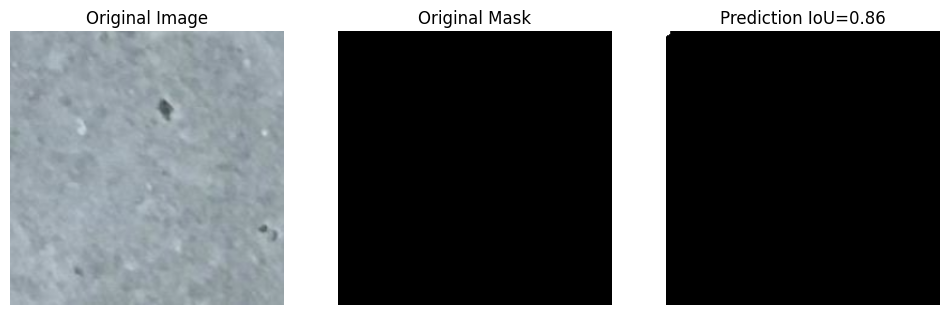

index =  5730
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_16088.jpg
1/1 [==============================] - 0s 32ms/step
(256, 256)


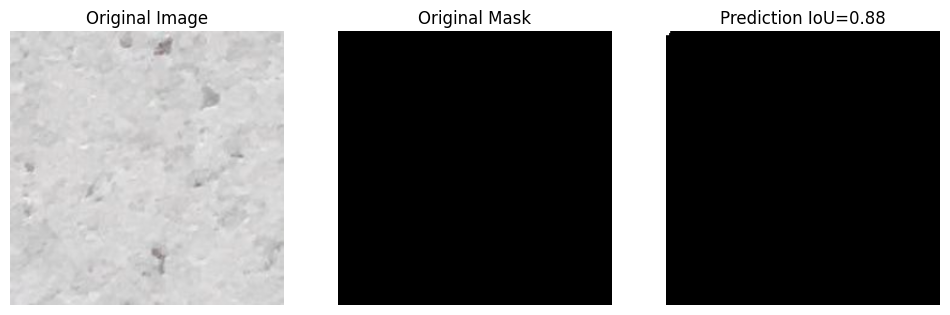

index =  5807
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_14572.jpg
1/1 [==============================] - 0s 30ms/step
(256, 256)


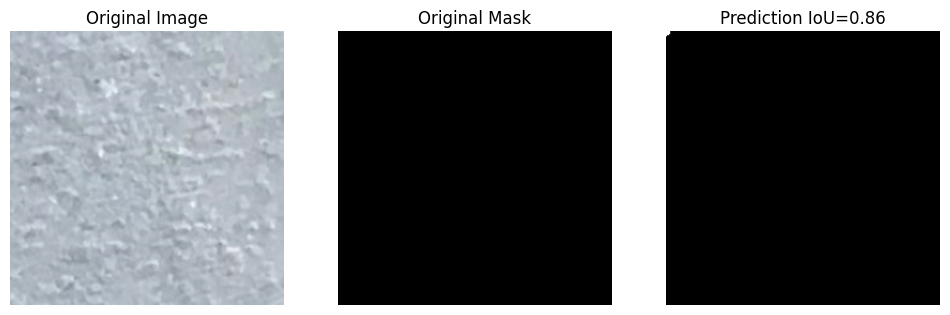

index =  2233
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_12666.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


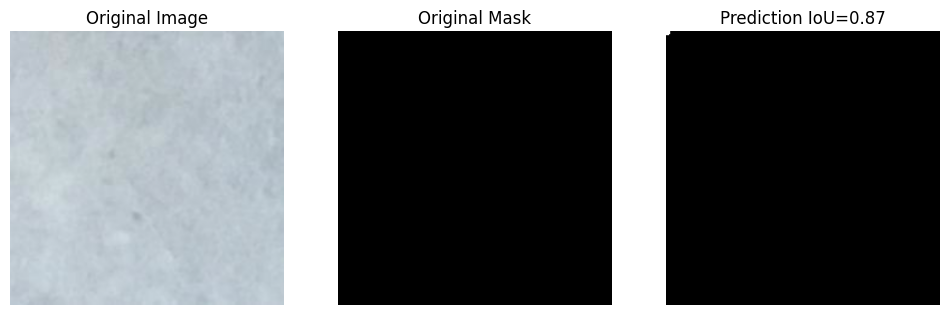

index =  1163
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_05009.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


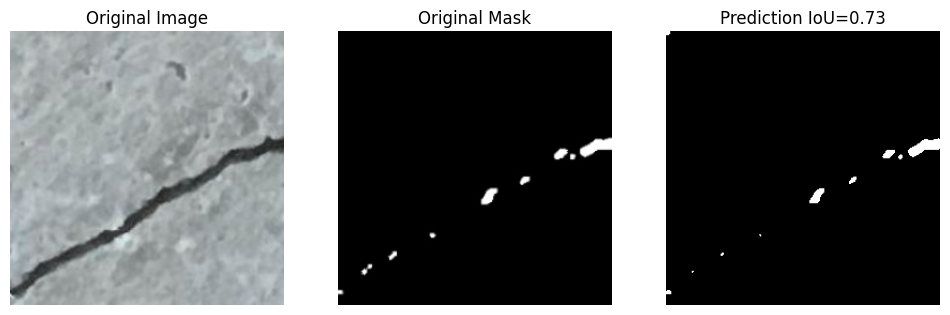

index =  6472
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_08906.jpg
1/1 [==============================] - 0s 29ms/step
(256, 256)


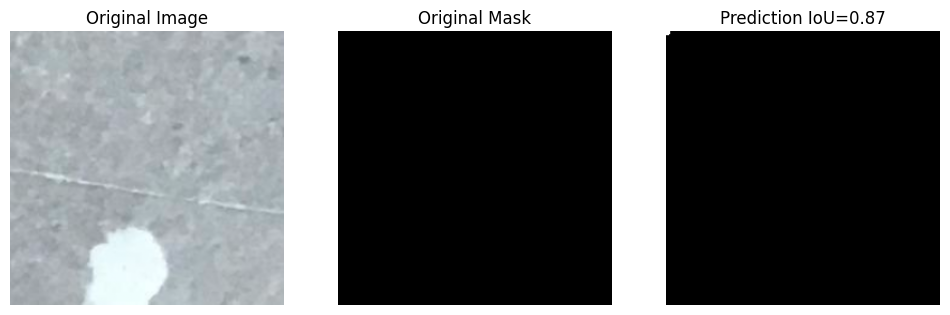

index =  1928
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_15033.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


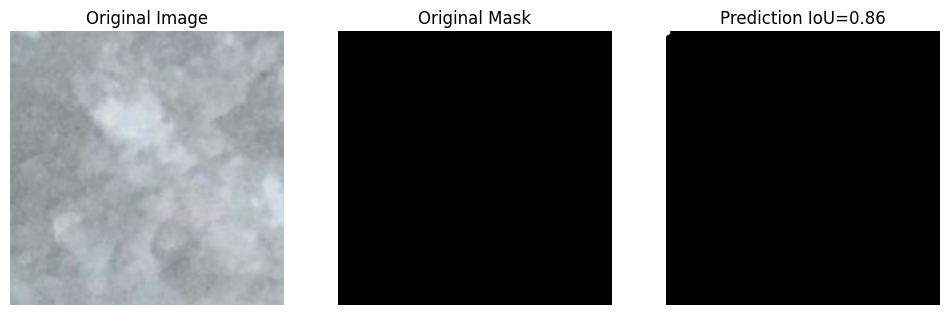

index =  3723
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_13886_1.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


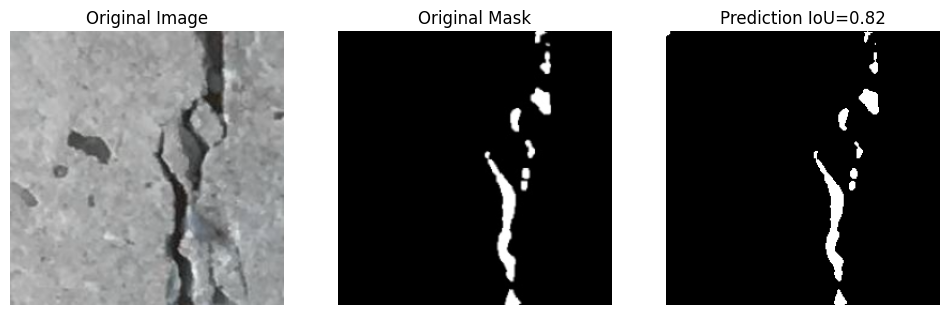

index =  2249
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_04814.jpg
1/1 [==============================] - 0s 27ms/step
(256, 256)


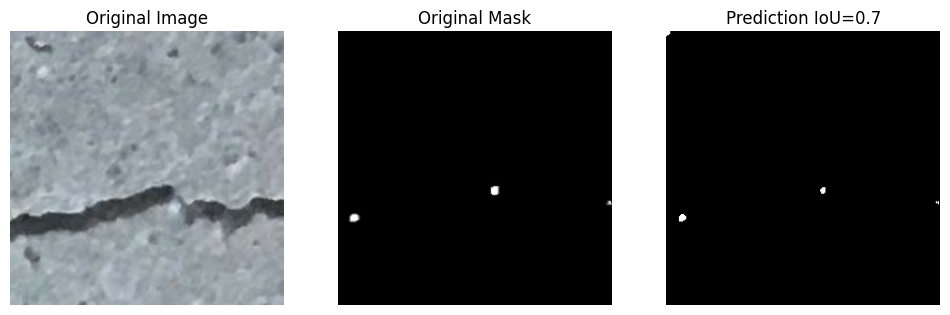

index =  2188
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_03005.jpg
1/1 [==============================] - 0s 31ms/step
(256, 256)


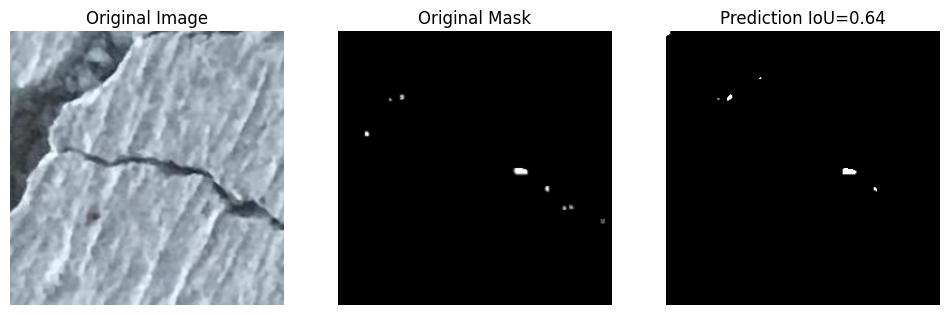

index =  7057
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_10148.jpg
1/1 [==============================] - 0s 42ms/step
(256, 256)


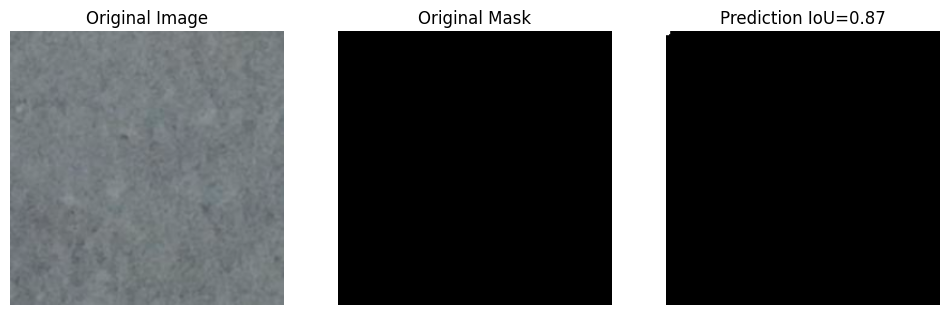

index =  5168
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_18020.jpg
1/1 [==============================] - 0s 29ms/step
(256, 256)


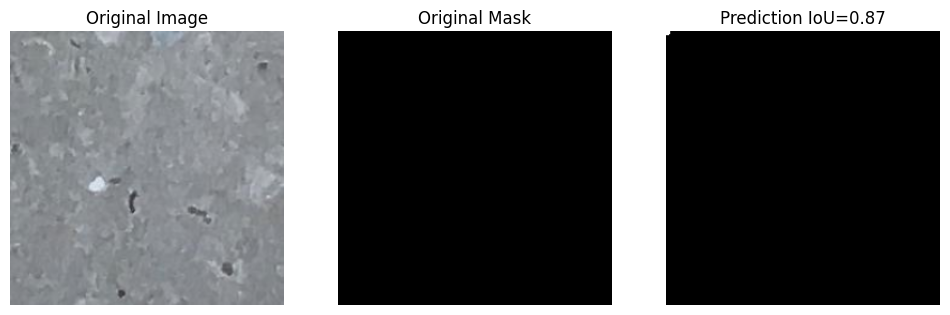

index =  6371
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_12766.jpg
1/1 [==============================] - 0s 29ms/step
(256, 256)


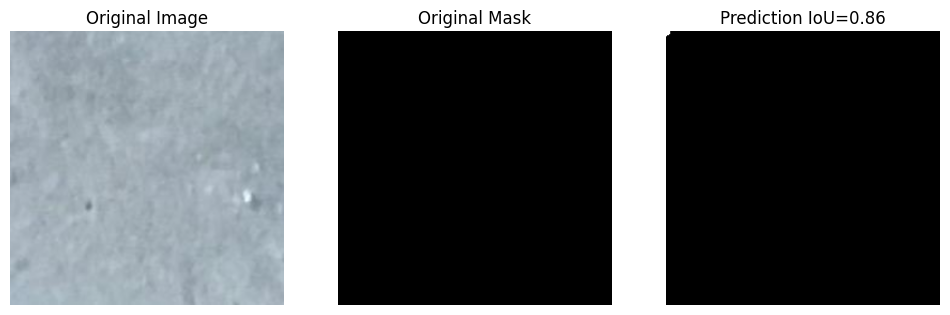

index =  4531
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_13423.jpg
1/1 [==============================] - 0s 29ms/step
(256, 256)


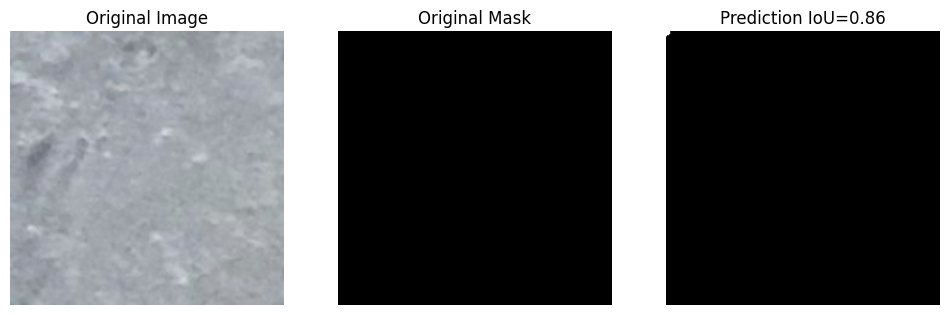

index =  5134
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_06592.jpg
1/1 [==============================] - 0s 29ms/step
(256, 256)


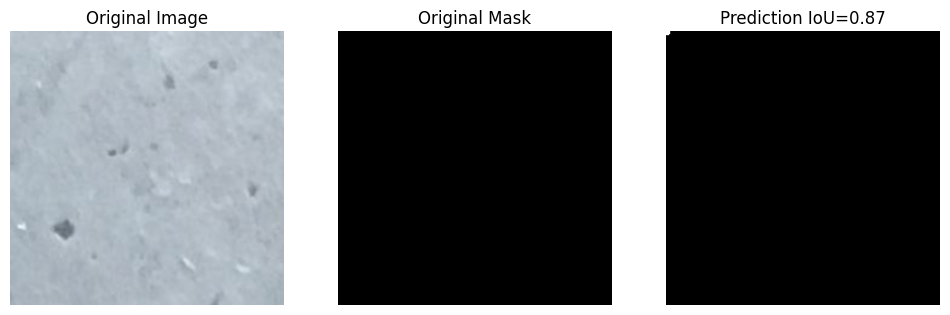

index =  3387
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_05554.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


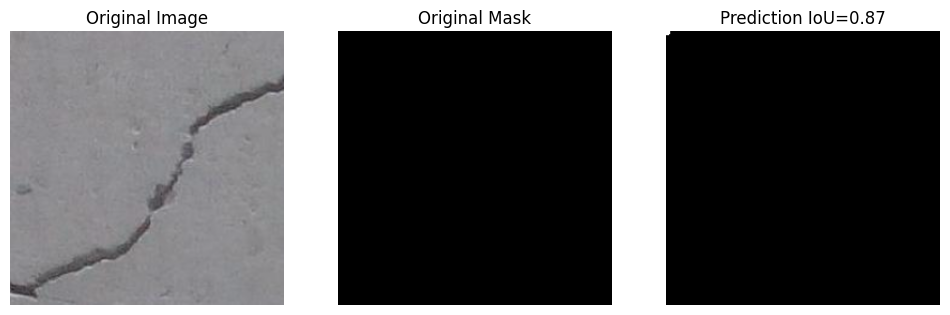

index =  714
name =  /home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_17222.jpg
1/1 [==============================] - 0s 28ms/step
(256, 256)


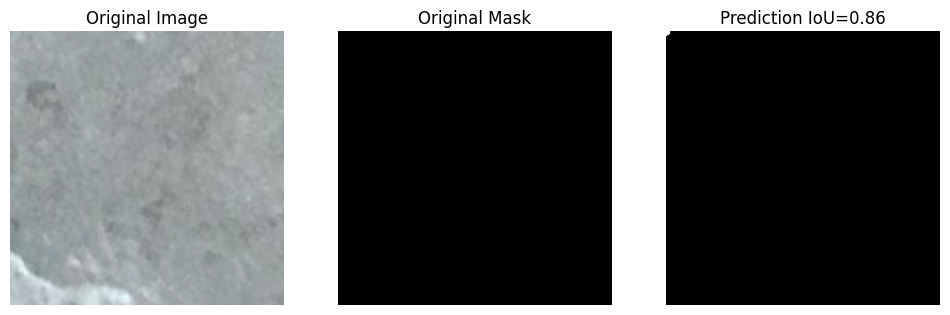

In [28]:
for _ in range(50):
    index = np.random.randint(1, len(unet_test_df.index))
    print('index = ', index)
    print('name = ', unet_test_df['unet_fullpaths_image'].iloc[index])
    
    img = cv2.imread(unet_test_df['unet_fullpaths_image'].iloc[index]) #,  cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (256, 256))
    img = img / 255
    img = img[np.newaxis, :, :]

    predicted_img = unet_model_2.predict(img)

    plt.figure(figsize=(12, 12))
    
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(img)) #, cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 3, 2)
    img_mask = np.squeeze(cv2.imread(unet_test_df['unet_fullpaths_mask'].iloc[index], cv2.IMREAD_GRAYSCALE))
    img_mask = cv2.resize(img_mask, (256, 256))
    print(img_mask.shape)
    plt.imshow(img_mask, cmap='gray') #, vmin=0, vmax=255)
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 3, 3)
    predicted_img = np.squeeze(predicted_img)
    predicted_img_threshold = 0.5
    predicted_img[predicted_img > predicted_img_threshold] = 1
    predicted_img[predicted_img <= predicted_img_threshold] = 0

    plt.imshow(predicted_img, cmap='gray', vmin=0, vmax=1)
    IoU = iou_coef(img_mask/255, predicted_img, smooth=100)
    plt.title('Prediction IoU='+str(np.around(IoU.numpy(), decimals=2)))
    plt.axis('off')
    
    plt.show()



### Save the model

In [29]:
unet_model_2.save('./unet_model_2_3')

INFO:tensorflow:Assets written to: ./unet_model_2_3/assets


INFO:tensorflow:Assets written to: ./unet_model_2_3/assets


### Load the model

In [ ]:
#unet_model_2 = keras.models.load_model('./unet_model_2_1', custom_objects = {"dice_loss": dice_loss, "iou_coef": iou_coef, "dice_coef": dice_coef})

<a id="crack_detection_3"></a>
# Semantic segmentation

In [30]:
def semantic_segmentation(input_image, height=100, width=100, height_src=unet_image_height, 
                            width_src=unet_image_width, debug=False, predicted_threshold = 0.75, plot_image=False):
    im = cv2.imread(input_image)
    imgheight, imgwidth, channels = im.shape
    k=0
    output_image = np.zeros_like(im)
    for i in range(0,imgheight,height):
        for j in range(0,imgwidth,width):
            a = im[i:i+height, j:j+width]
            shape_ini = a.shape # Save shape of the tile
            a = cv2.resize(a, (height_src, width_src)) # Resize the shape of the tile to the shape of the input layer
            mask_pred = np.zeros_like(a, dtype=np.uint16)
            mask_pred = np.squeeze(unet_model_2.predict(np.array(a).reshape(1,height_src, width_src,3)/255.0, verbose=0))
            mask_pred_2 = np.stack((mask_pred,)*3, axis=-1).astype(np.uint8)    
            predicted_img_threshold = predicted_threshold
            mask_pred_2[mask_pred_2 > predicted_img_threshold] = 1
            mask_pred_2[mask_pred_2 <= predicted_img_threshold] = 0
            mask_pred_2 = mask_pred_2 * 255
            mask_pred_2[np.where((mask_pred_2==[255, 255, 255]).all(axis=2))] = [255, 0, 0]
            if debug == True:
               print('mask_pred_2.shape: ', mask_pred_2.shape)
               plt.imshow(mask_pred_2)
               plt.show()
            add_img = cv2.addWeighted(a, 0.7, mask_pred_2, 0.3, 0)
            output_image[i:i+height, j:j+width,:] = cv2.resize(add_img, (shape_ini[1], shape_ini[0])) # reshape the tile to its initial shape
            k+=1
    if plot_image == True:
       plt.figure(figsize = (20,10))
       plt.imshow(output_image, aspect='auto')
       plt.show()
    else:
       return output_image

In [31]:
#infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/grunge-concrete-cement-wall-cracked-concrete.jpg'
#infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/crack-695010_960_720.jpg'
#infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/3632302149_9670ace43a_b.jpg'
#infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/images_cracks.jpg'
infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/texture-993878_1280.jpg'
#infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/IMG_20230611_174743.jpg'
#infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/IMG_20230611_174749.jpg'
#infile = '/home/philippe/development/python/concrete_cracks_semantic_segmentation/large_images/IMG_20230611_174756.jpg'

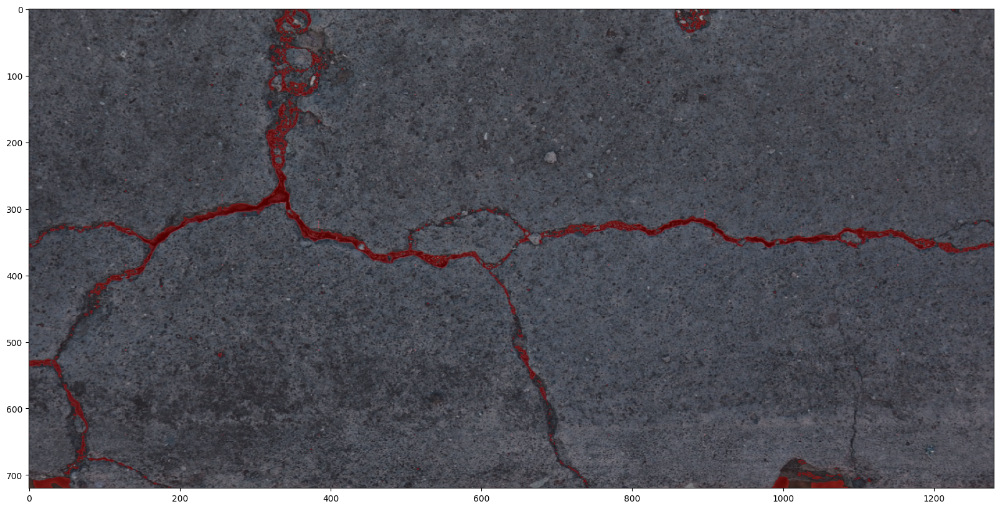

CPU times: user 4.86 s, sys: 306 ms, total: 5.17 s
Wall time: 5.05 s


In [32]:
%%time
semantic_segmentation(infile, height=128, width=128, height_src=unet_image_height, 
                            width_src=unet_image_width, debug=False, predicted_threshold = 0.5, plot_image=True)

<a id="test_on_other_source"></a>
# Compare masks from alternative datasource

In [33]:
crack_test_dir = "/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/"

crack_test_base_dataset = image_dataset_from_directory(
    crack_test_dir,
    labels=None,
    image_size = (unet_image_height, unet_image_width),
    crop_to_aspect_ratio = True,
    shuffle = False,
    batch_size = 1)

Found 1604 files belonging to 1 classes.


In [34]:
crack_test_base_df = pd.DataFrame(crack_test_base_dataset.file_paths.copy())
crack_test_base_df.columns = ['crack_test_fullpaths_image']
crack_test_base_df[['crack_test_fullpaths_mask']] = crack_test_base_df[['crack_test_fullpaths_image']]
crack_test_base_df['crack_test_fullpaths_mask'] = crack_test_base_df.apply(lambda x: str(x.crack_test_fullpaths_image).replace('image', 'mask'), axis=1)
# crack_test_base_df['crack_test_fullpaths_mask'] = crack_test_base_df.apply(lambda x: str(x.crack_test_fullpaths_image).replace('jpg', 'png'), axis=1)

In [35]:
pd.set_option('display.max_colwidth', None)

In [36]:
display(crack_test_base_df)

,crack_test_fullpaths_image,crack_test_fullpaths_mask
0,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-1.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-1.jpg
1,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-10.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-10.jpg
2,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-100.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-100.jpg
3,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-101.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-101.jpg
4,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-102.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-102.jpg
...,...,...
1599,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-99.png,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-99.png
1600,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/.ipynb_checkpoints/crack-o-1-checkpoint.png,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/.ipynb_checkpoints/crack-o-1-checkpoint.png
1601,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/.ipynb_checkpoints/crack-o-10-checkpoint.png,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/.ipynb_checkpoints/crack-o-10-checkpoint.png
1602,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/.ipynb_checkpoints/crack-o-100-checkpoint.png,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/.ipynb_checkpoints/crack-o-100-checkpoint.png


In [37]:
crack_test_base_df = crack_test_base_df[~crack_test_base_df['crack_test_fullpaths_image'].str.contains("mask")]

In [38]:
crack_test_base_df['crack_test_fullpaths_mask'] = crack_test_base_df.apply(lambda x: str(x.crack_test_fullpaths_mask).replace('jpg', 'png'), axis=1)

In [39]:
display(crack_test_base_df)

,crack_test_fullpaths_image,crack_test_fullpaths_mask
0,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-1.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-1.png
1,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-10.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-10.png
2,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-100.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-100.png
3,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-101.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-101.png
4,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-102.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-102.png
...,...,...
795,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-95.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-95.png
796,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-96.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-96.png
797,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-97.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-97.png
798,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/images/crack-o-98.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/crack_datatest/masks/crack-o-98.png


1/1 [==============================] - 0s 43ms/step


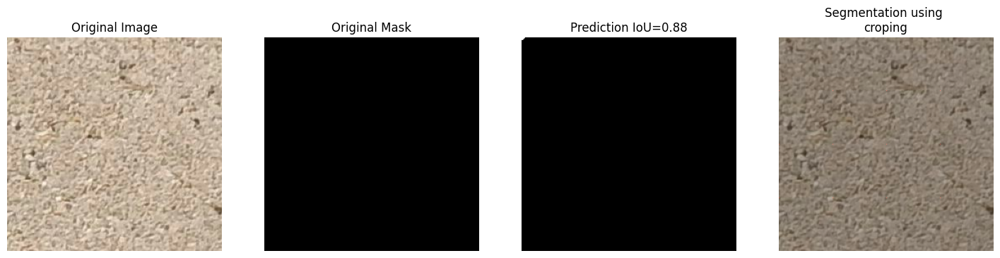

1/1 [==============================] - 0s 22ms/step


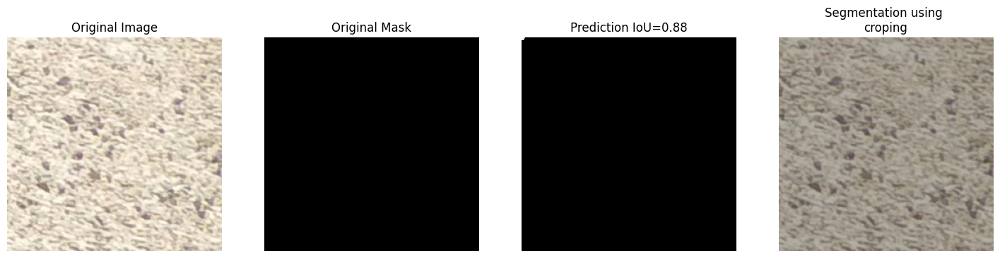

1/1 [==============================] - 0s 25ms/step


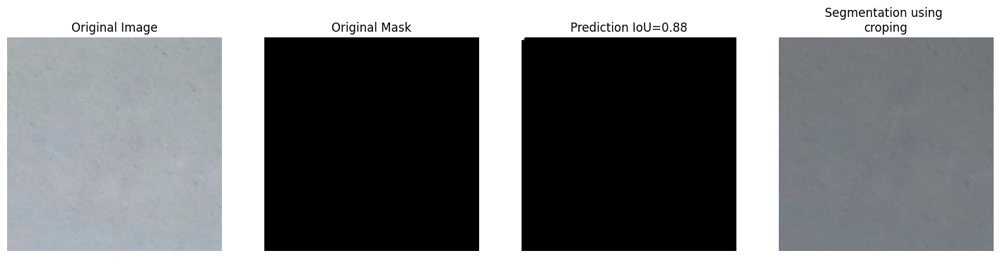

1/1 [==============================] - 0s 23ms/step


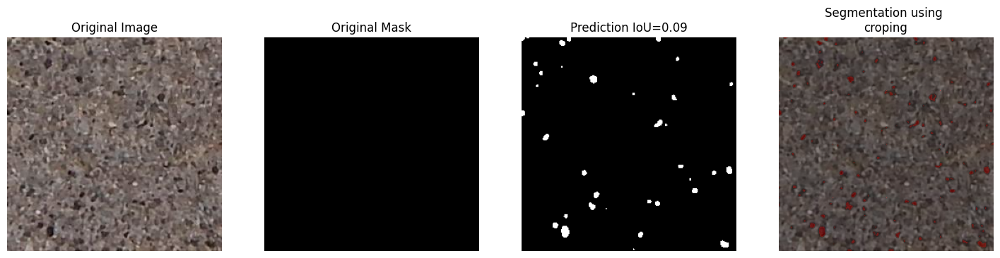

1/1 [==============================] - 0s 20ms/step


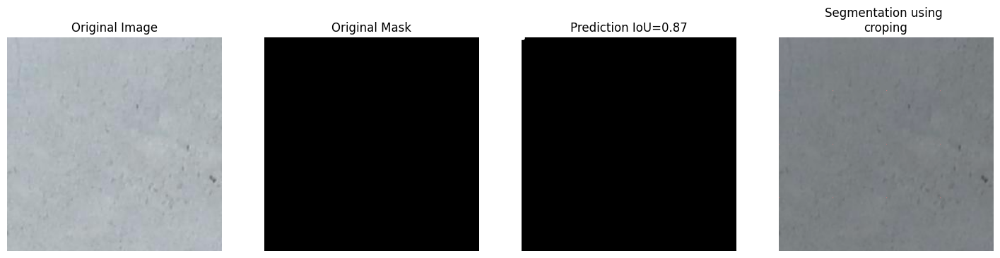

1/1 [==============================] - 0s 24ms/step


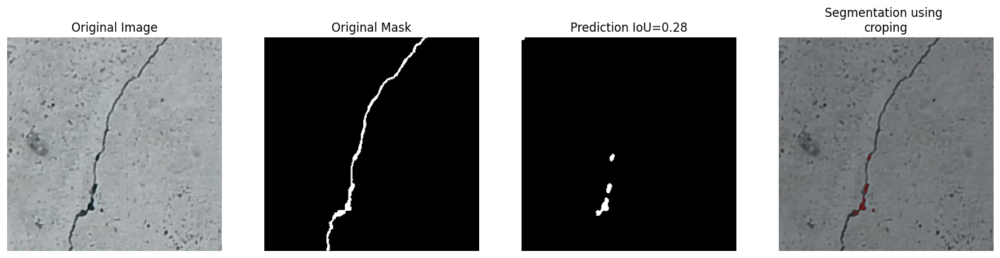

1/1 [==============================] - 0s 20ms/step


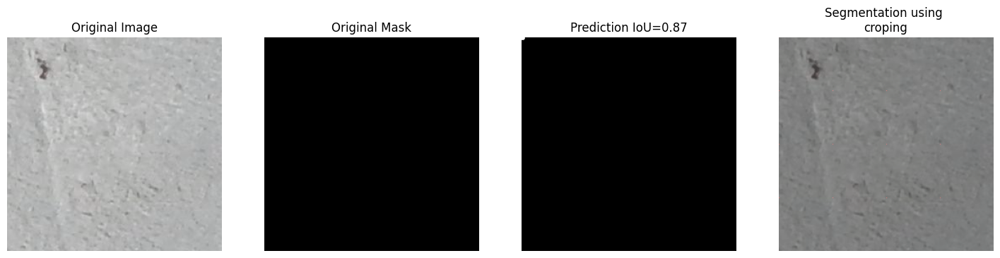

1/1 [==============================] - 0s 20ms/step


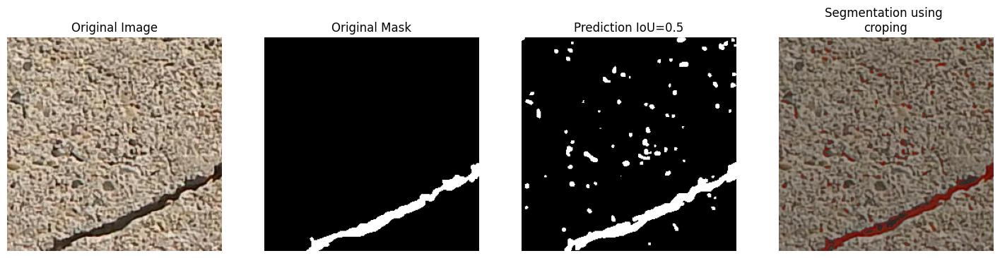

1/1 [==============================] - 0s 31ms/step


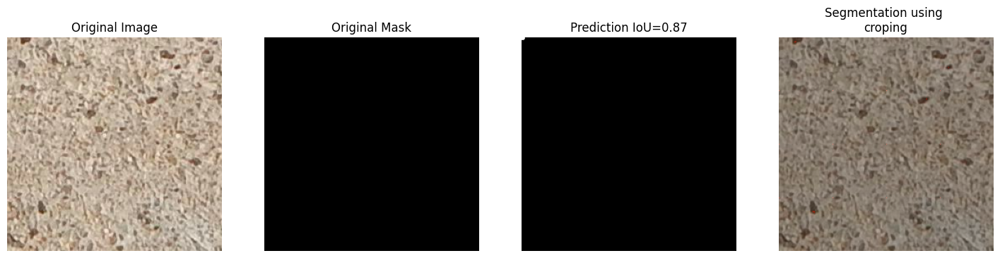

1/1 [==============================] - 0s 32ms/step


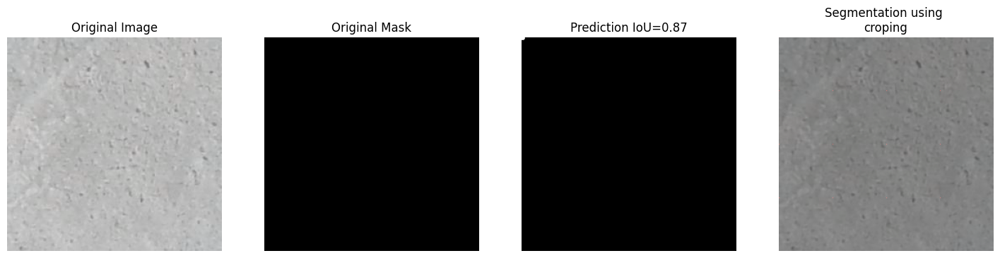

1/1 [==============================] - 0s 21ms/step


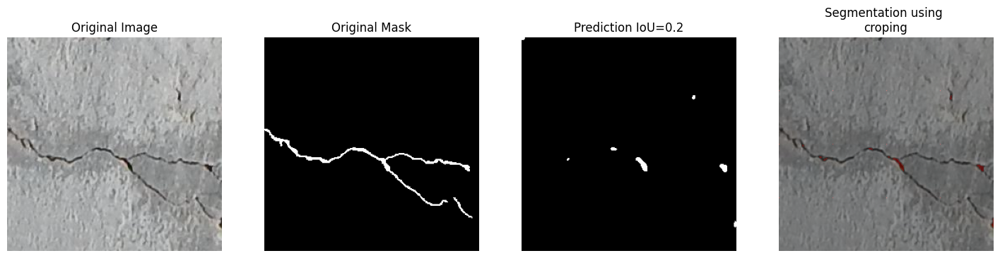

1/1 [==============================] - 0s 22ms/step


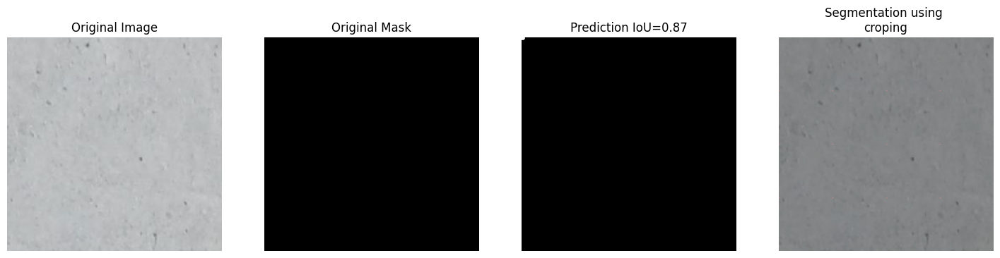

1/1 [==============================] - 0s 24ms/step


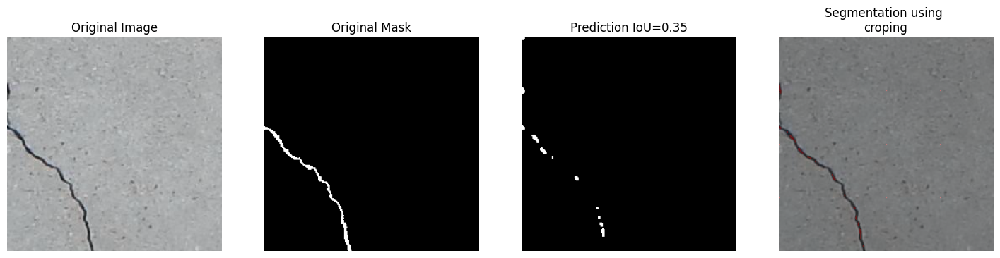

1/1 [==============================] - 0s 29ms/step


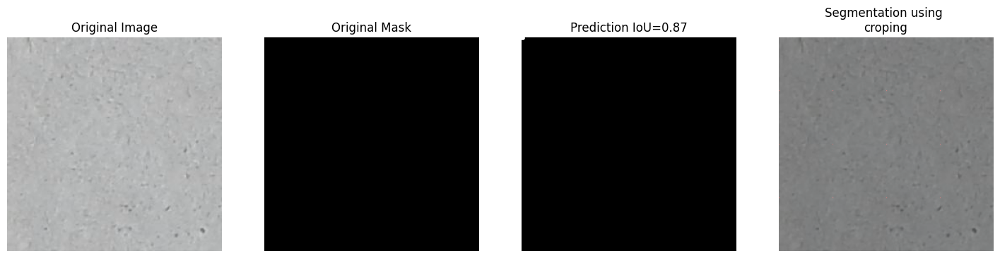

1/1 [==============================] - 0s 19ms/step


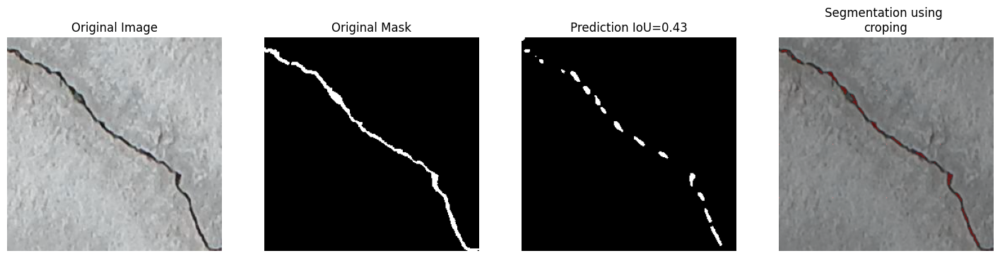

1/1 [==============================] - 0s 19ms/step


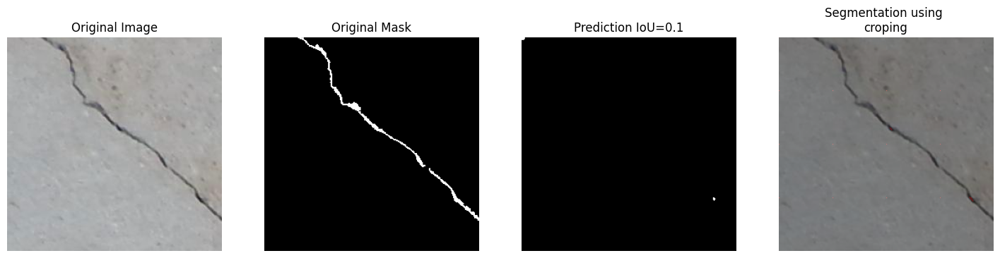

1/1 [==============================] - 0s 21ms/step


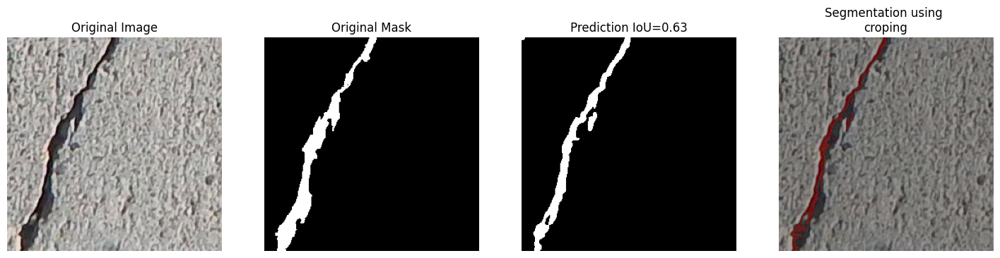

1/1 [==============================] - 0s 20ms/step


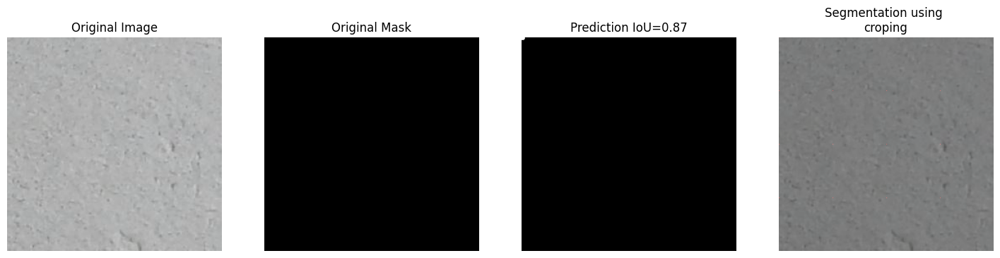

1/1 [==============================] - 0s 25ms/step


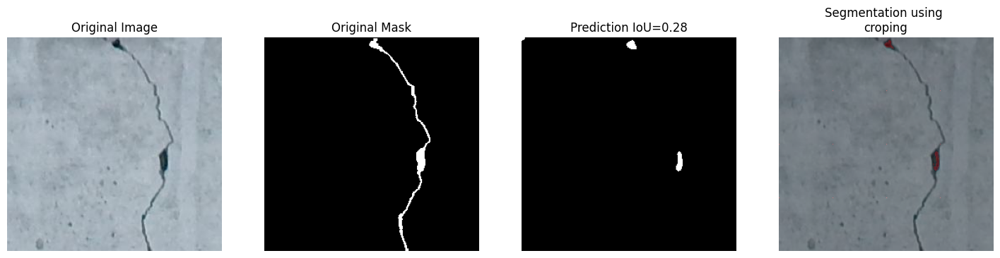

1/1 [==============================] - 0s 30ms/step


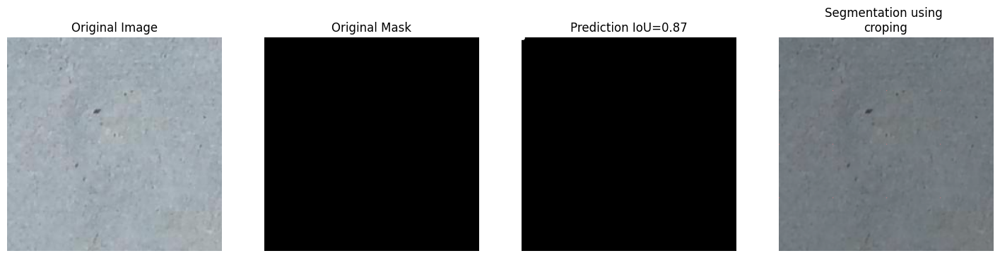

1/1 [==============================] - 0s 22ms/step


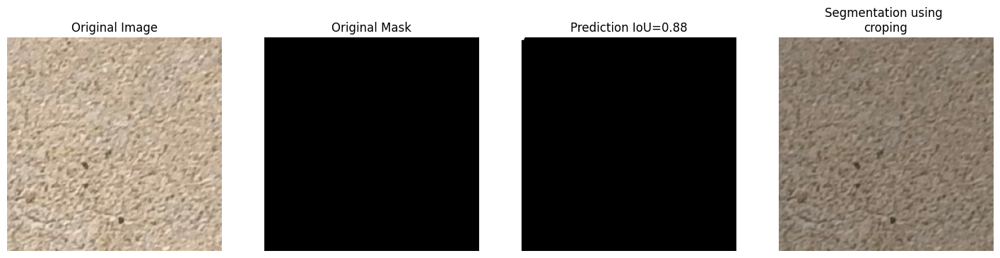

1/1 [==============================] - 0s 21ms/step


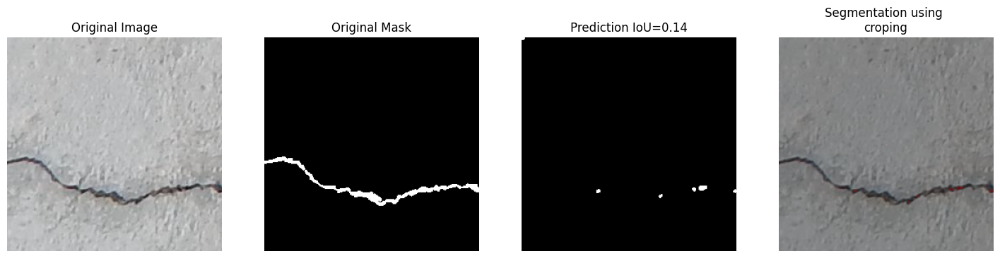

1/1 [==============================] - 0s 24ms/step


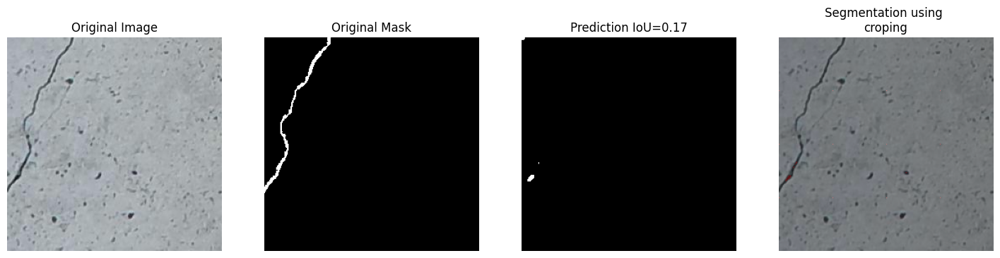

1/1 [==============================] - 0s 19ms/step


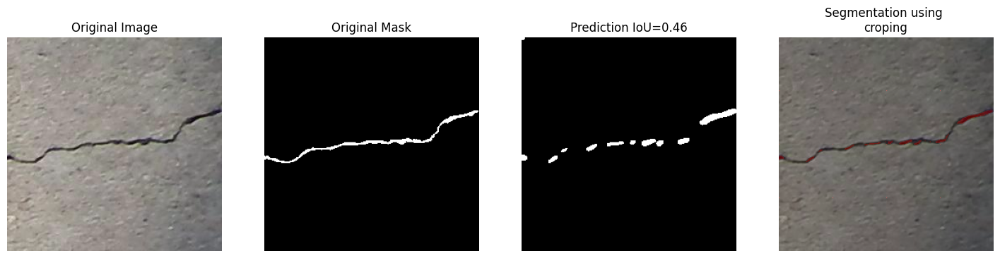

1/1 [==============================] - 0s 20ms/step


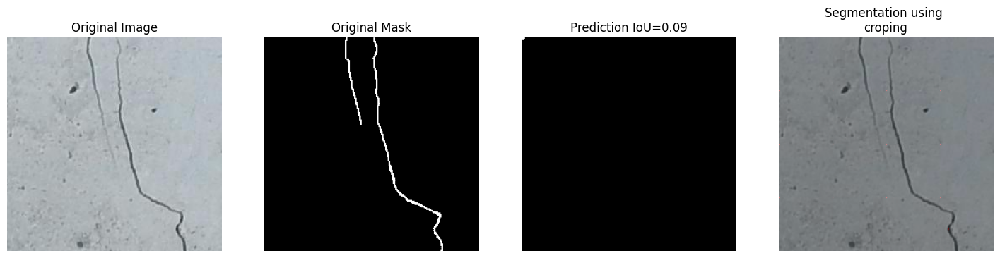

1/1 [==============================] - 0s 21ms/step


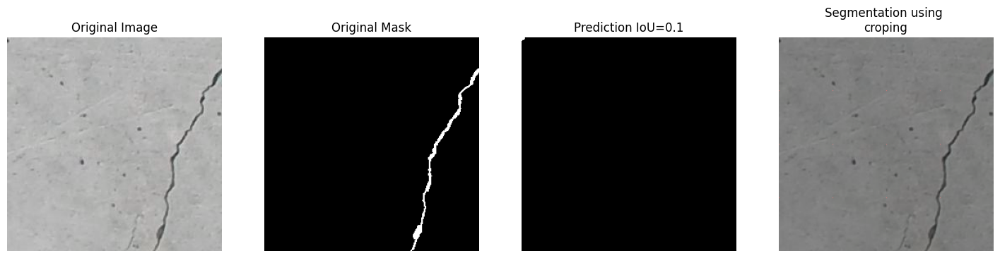

1/1 [==============================] - 0s 22ms/step


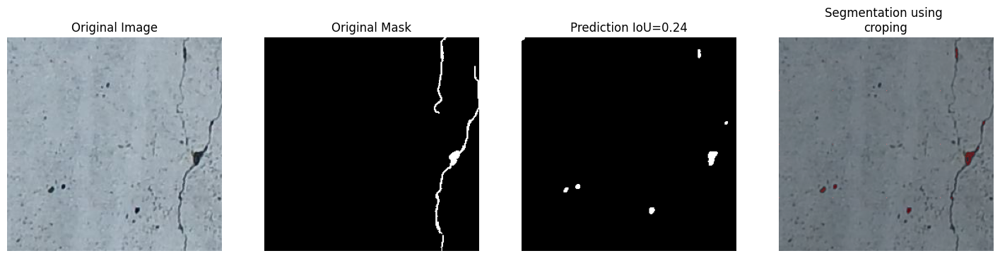

1/1 [==============================] - 0s 22ms/step


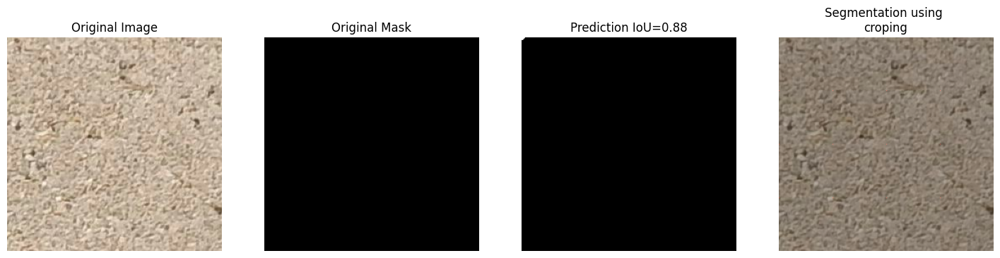

1/1 [==============================] - 0s 20ms/step


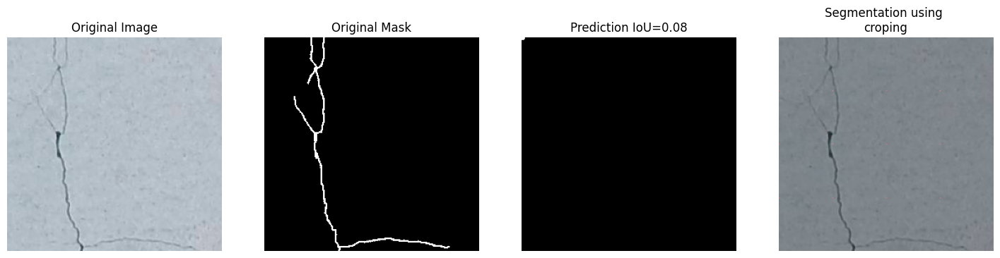

1/1 [==============================] - 0s 20ms/step


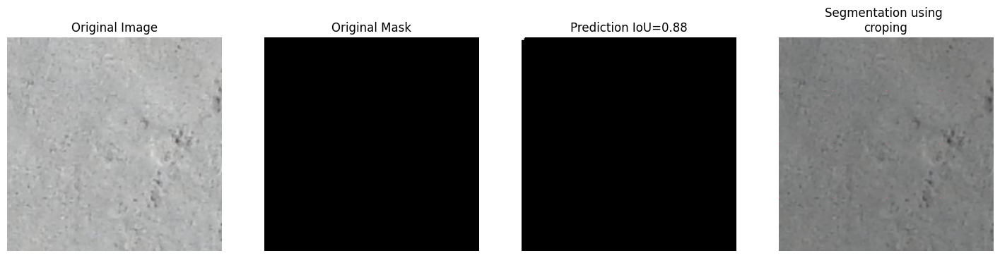

1/1 [==============================] - 0s 26ms/step


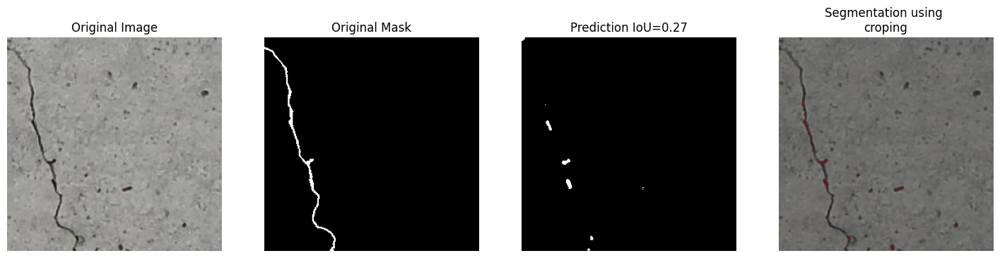

1/1 [==============================] - 0s 19ms/step


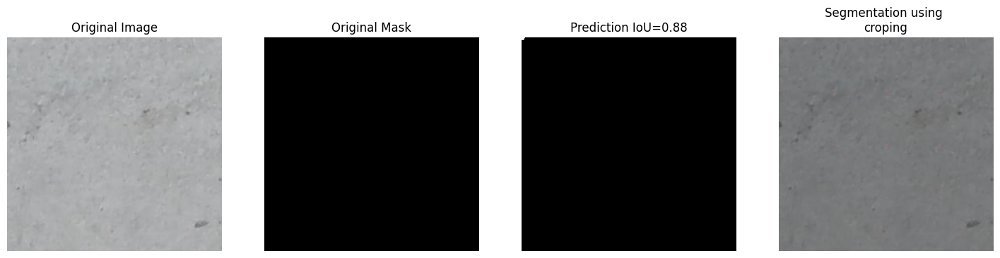

1/1 [==============================] - 0s 34ms/step


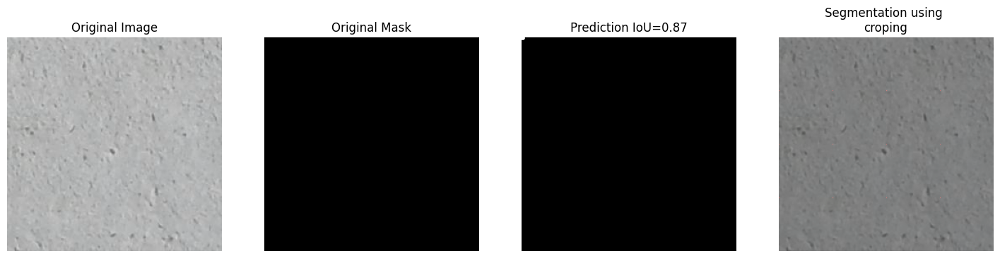

1/1 [==============================] - 0s 31ms/step


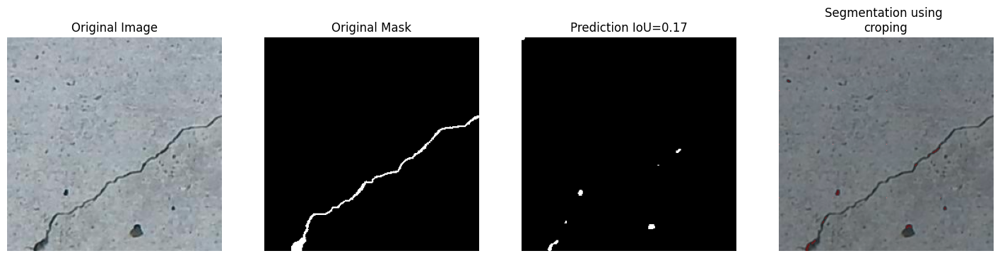

1/1 [==============================] - 0s 23ms/step


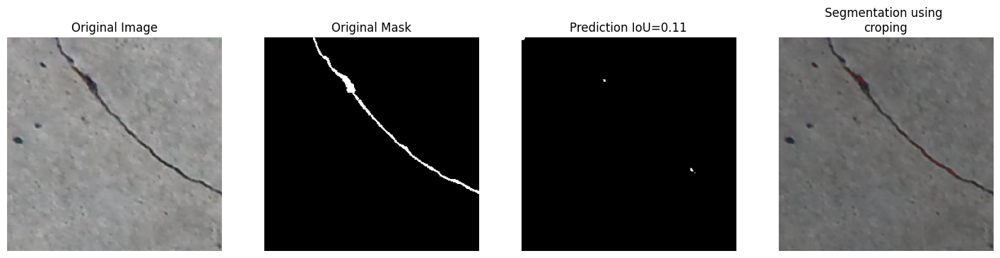

1/1 [==============================] - 0s 31ms/step


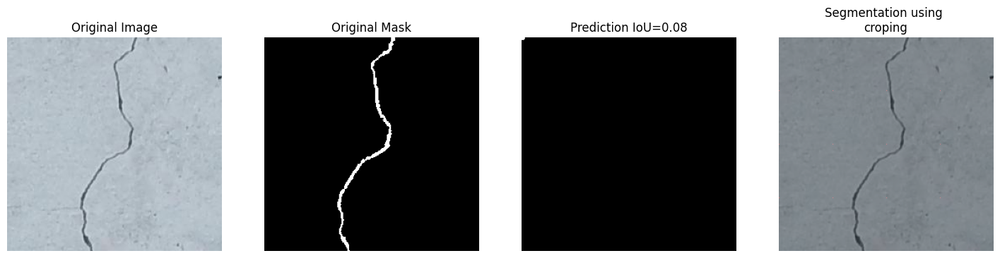

1/1 [==============================] - 0s 46ms/step


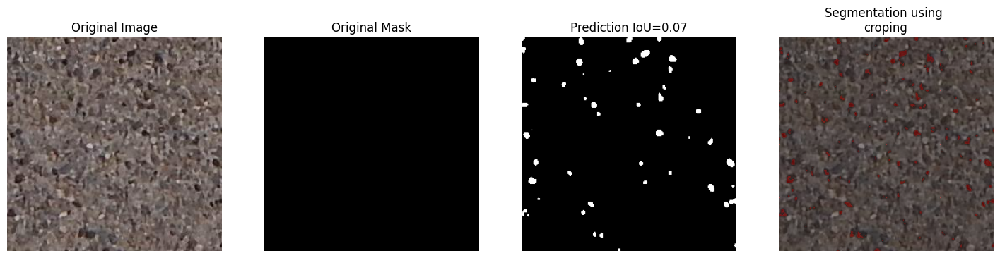

1/1 [==============================] - 0s 21ms/step


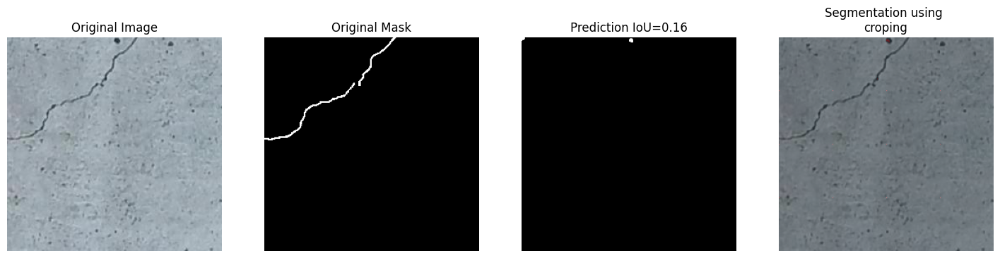

1/1 [==============================] - 0s 22ms/step


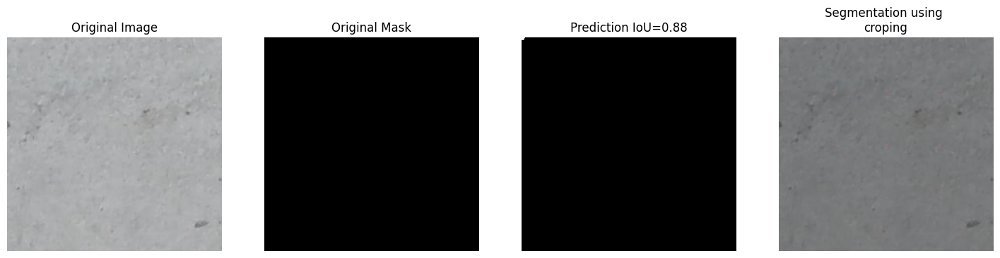

1/1 [==============================] - 0s 19ms/step


In [ ]:
for _ in range(50):
    index = np.random.randint(1, len(crack_test_base_df.index))
#    print('index = ', index)
#    print('name = ', crack_test_base_df['crack_test_fullpaths_image'].iloc[index])
    
    img = cv2.imread(crack_test_base_df['crack_test_fullpaths_image'].iloc[index]) #,  cv2.IMREAD_GRAYSCALE)

    plt.figure(figsize=(18, 18))
    
    plt.subplot(1, 4, 1)
    plt.imshow(np.squeeze(img)) #, cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 4, 2)
    img_mask = np.squeeze(cv2.imread(crack_test_base_df['crack_test_fullpaths_mask'].iloc[index],  cv2.IMREAD_GRAYSCALE))
    plt.imshow(img_mask , cmap='gray') #, vmin=0, vmax=255)
    plt.axis('off')
    plt.title('Original Mask')

    plt.subplot(1, 4, 3)
    img = cv2.resize(img, (256, 256))
    img = img / np.max(img)
    img = img[np.newaxis, :, :]

    predicted_img = unet_model_2.predict(img)
    predicted_img = np.squeeze(predicted_img)
    predicted_img_threshold = 0.5
    predicted_img[predicted_img > predicted_img_threshold] = 1
    predicted_img[predicted_img <= predicted_img_threshold] = 0

    plt.imshow(predicted_img, cmap='gray', vmin=0, vmax=1)
    IoU = iou_coef(img_mask/(img_mask.max()+0.01), predicted_img, smooth=100)
    plt.title('Prediction IoU='+str(np.around(IoU.numpy(), decimals=2)))
    plt.axis('off')

    plt.subplot(1, 4, 4)
    seg_img = semantic_segmentation(crack_test_base_df['crack_test_fullpaths_image'].iloc[index], height=64, width=64, 
                                    height_src=unet_image_height, width_src=unet_image_width, debug=False, predicted_threshold = 0.8, plot_image=False)
    seg_img = cv2.resize(seg_img, (256, 256))
    plt.imshow(seg_img)
    plt.title('Segmentation using \ncroping')
    plt.axis('off')

    plt.show()
    
    